# DIABETES TYPE PREDICTION [USING NHANES DATASET]

Diabetes is a chronic disease so we are predicting the diabetes using a new dataset NHANES. Previously I have used Pima Indian and Ohio Longitudnal dataset, however it needs an upgradation I saw a numerous medical records dataset in which it contains many types of records from this we can predict the desired disease, however here it is diabetes. <br>
Firstly, we will predict the early diabetes by setting some glucose and insulin level values and after this we will predict the types of diabetes using some more features values. <br>
Here, we have glycohemoglobin instead of the glucose.
There will be some queries about the glycohemoglobin and glucose so it is simple: <br>
"*Glucose (a type of sugar) molecules in the blood normally become stuck to hemoglobin molecules - this means the hemoglobin has become glycosylated (also referred to as hemoglobin A1c, or HbA1c). As a person's blood sugar becomes higher, more of the person's hemoglobin becomes glycosylated.*"

In this notebook, prediction goes on with the new datasets. 
* Previously, in the last notebook we have taken two datasets: `Pima Indian Diabetes Dataset` & `Ohio Longitudnal Dataset`.
* This notebook will contain the datasets: `NHANE dataset` & `Alzhiemer Disease`.

The Goal of this notebook is:
* Firstly, to predict the Diabetes from this dataset 
* Secondly, to predict the `Type-I`, `Type-II`, `Type-III` from the dataset.

This is a research work undergoing... 

# DATA ANALYSIS OF THE DATASET [Using Pandas]

## Upgrading the pandas

In [1]:
!pip install --upgrade pandas seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 83.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 18.6 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.1
    Uninstalling pandas-2.2.1:
      Successfully uninstalled pandas-2.2.1
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.12.2
    Uninstalling seaborn-0.12.2:
      Successfully uninstalled seaborn-0.12.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 24.4.1 requires cubinlinker, which is not installed.
cudf 24.4.1 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.4.1 requires ptxcompiler, which is not installed.
cuml 24.4.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 24.4.1 requires cupy-cuda11x>=12.0.0, which is not installed.
tensorflow-decision-forests 1.8.

In [2]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


## Importing the necessary libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

## Reading the Files of the Dataset

In [4]:
demographic = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/demographic.csv', encoding='latin1')
diet = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/diet.csv', encoding='latin1')
examination = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/examination.csv', encoding='latin1')
labs = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/labs.csv', encoding='latin1')
medications = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/medications.csv', encoding='latin1')
questionnaire = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/questionnaire.csv', encoding='latin1')

## Seeing the top rows and columns of each dataframe

In [5]:
demo_df = demographic.head()
diet_df = diet.head()
exam_df = examination.head()
labs_df = labs.head()
medi_df = medications.head()
quest_df = questionnaire.head()

print("---------- DEMOGRAPHICS ----------")
print(demo_df)
print("\n---------- DIET ----------")
print(diet_df)
print("\n---------- EXAMINATION ----------")
print(exam_df)
print("\n---------- LABORATORY ----------")
print(labs_df)
print("\n---------- MEDICATIONS ----------")
print(medi_df)
print("\n---------- QUESTIONNAIRE ----------")
print(quest_df)

---------- DEMOGRAPHICS ----------
    SEQN  SDDSRVYR  RIDSTATR  RIAGENDR  RIDAGEYR  RIDAGEMN  RIDRETH1  \
0  73557         8         2         1        69       NaN         4   
1  73558         8         2         1        54       NaN         3   
2  73559         8         2         1        72       NaN         3   
3  73560         8         2         1         9       NaN         3   
4  73561         8         2         2        73       NaN         3   

   RIDRETH3  RIDEXMON  RIDEXAGM  ...  DMDHREDU  DMDHRMAR  DMDHSEDU  \
0         4       1.0       NaN  ...       3.0       4.0       NaN   
1         3       1.0       NaN  ...       3.0       1.0       1.0   
2         3       2.0       NaN  ...       4.0       1.0       3.0   
3         3       1.0     119.0  ...       3.0       1.0       4.0   
4         3       1.0       NaN  ...       5.0       1.0       5.0   

       WTINT2YR      WTMEC2YR  SDMVPSU  SDMVSTRA  INDHHIN2  INDFMIN2  INDFMPIR  
0  13281.237386  13481.042095 

## Displaying the information of each dataframe

In [6]:
print("---------- DEMOGRAPHICS ----------")
print(demo_df.info())
print("\n---------- DIET ----------")
print(diet_df.info())
print("\n---------- EXAMINATION ----------")
print(exam_df.info())
print("\n---------- LABORATORY ----------")
print(labs_df.info())
print("\n---------- MEDICATIONS ----------")
print(medi_df.info())
print("\n---------- QUESTIONNAIRE ----------")
print(quest_df.info())

---------- DEMOGRAPHICS ----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 47 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEQN      5 non-null      int64  
 1   SDDSRVYR  5 non-null      int64  
 2   RIDSTATR  5 non-null      int64  
 3   RIAGENDR  5 non-null      int64  
 4   RIDAGEYR  5 non-null      int64  
 5   RIDAGEMN  0 non-null      float64
 6   RIDRETH1  5 non-null      int64  
 7   RIDRETH3  5 non-null      int64  
 8   RIDEXMON  5 non-null      float64
 9   RIDEXAGM  1 non-null      float64
 10  DMQMILIZ  4 non-null      float64
 11  DMQADFC   2 non-null      float64
 12  DMDBORN4  5 non-null      int64  
 13  DMDCITZN  5 non-null      float64
 14  DMDYRSUS  0 non-null      float64
 15  DMDEDUC3  1 non-null      float64
 16  DMDEDUC2  4 non-null      float64
 17  DMDMARTL  4 non-null      float64
 18  RIDEXPRG  0 non-null      float64
 19  SIALANG   5 non-null      int64  
 20  S

## Displaying the columns of each dataframe

In [7]:
print("---------- DEMOGRAPHICS ----------")
print(demo_df.columns)
print("\n---------- DIET ----------")
print(diet_df.columns)
print("\n---------- EXAMINATION ----------")
print(exam_df.columns)
print("\n---------- LABORATORY ----------")
print(labs_df.columns)
print("\n---------- MEDICATIONS ----------")
print(medi_df.columns)
print("\n---------- QUESTIONNAIRE ----------")
print(quest_df.columns)

---------- DEMOGRAPHICS ----------
Index(['SEQN', 'SDDSRVYR', 'RIDSTATR', 'RIAGENDR', 'RIDAGEYR', 'RIDAGEMN',
       'RIDRETH1', 'RIDRETH3', 'RIDEXMON', 'RIDEXAGM', 'DMQMILIZ', 'DMQADFC',
       'DMDBORN4', 'DMDCITZN', 'DMDYRSUS', 'DMDEDUC3', 'DMDEDUC2', 'DMDMARTL',
       'RIDEXPRG', 'SIALANG', 'SIAPROXY', 'SIAINTRP', 'FIALANG', 'FIAPROXY',
       'FIAINTRP', 'MIALANG', 'MIAPROXY', 'MIAINTRP', 'AIALANGA', 'DMDHHSIZ',
       'DMDFMSIZ', 'DMDHHSZA', 'DMDHHSZB', 'DMDHHSZE', 'DMDHRGND', 'DMDHRAGE',
       'DMDHRBR4', 'DMDHREDU', 'DMDHRMAR', 'DMDHSEDU', 'WTINT2YR', 'WTMEC2YR',
       'SDMVPSU', 'SDMVSTRA', 'INDHHIN2', 'INDFMIN2', 'INDFMPIR'],
      dtype='object')

---------- DIET ----------
Index(['SEQN', 'WTDRD1', 'WTDR2D', 'DR1DRSTZ', 'DR1EXMER', 'DRABF', 'DRDINT',
       'DR1DBIH', 'DR1DAY', 'DR1LANG',
       ...
       'DRD370QQ', 'DRD370R', 'DRD370RQ', 'DRD370S', 'DRD370SQ', 'DRD370T',
       'DRD370TQ', 'DRD370U', 'DRD370UQ', 'DRD370V'],
      dtype='object', length=168)

----------

# FEATURE EXTRACTION

The features that can be used for the **Diabetes Prediction**.

### Demographic Data (demographic.csv):
* **SEQN**: Unique identifier for each participant.
* **RIAGENDR**: Gender.
* **RIDAGEYR**: Age.
* **RIDRETH1**: Ethnicity.
* **INDFMPIR**: Family poverty income ratio (socioeconomic factor).

### Diet Data (diet.csv):
* **WTDRD1**: Dietary recall sample weight.
* **DR1DBIH**: Number of days of intake recall.
* **DR1DAY**: Type of intake day (1=weekend, 2=weekday).
* **Body Mass Index (BMI) (BMXBMI)**: High BMI is a significant risk factor for Type-2 diabetes.
* **Waist Circumference (BMXWAIST)**: Central obesity is linked to insulin resistance and Type-2 diabetes.
* **Blood Pressure (BPXSY1, BPXDI1)**: Hypertension is often associated with Type-2 diabetes.

### Examination Data (examination.csv):
* **BPXSY1**: Systolic blood pressure.
* **BPXDI1**: Diastolic blood pressure.
* **BPXPULS**: Pulse.
* **Fasting Glucose (LBXGLU or GLUCOSA)**: Elevated fasting glucose levels are directly indicative of diabetes.
* **HbA1c Levels (LBXGH)**: Glycated hemoglobin reflects long-term glucose control and is used in diabetes diagnosis.
* **Insulin Levels (LBXIN)**: Low insulin production is indicative of Type-1 diabetes, while high levels may indicate insulin resistance typical in Type-2 diabetes.
* **C-Peptide Levels (LBXCPT)**: Helps distinguish between Type-1 and Type-2 diabetes.
* **Lipid Profile (Cholesterol, HDL, LDL, Triglycerides)**: Dyslipidemia is common in diabetes, especially Type-2.

### Lab Data (labs.csv):
* **LBXGLU**: Fasting blood glucose level.
* **LBXGH**: Glycohemoglobin (HbA1c, indicates long-term glucose control).
* **URXUMA**: Albumin (related to kidney function).

### Medications Data (medications.csv):
* **RXDUSE**: Use of diabetes medications.
* **RXDDRUG**: Specific drugs used (insulin, metformin, etc.).

### Questionnaire Data (questionnaire.csv):
* **DIQ010**: Doctor told you have diabetes.
* **DIQ160**: Taking insulin.
* **DIQ170**: Taking diabetes pills.
* **Cognitive Function Tests (CFQ)**: Indicators of cognitive decline, which may be linked to Type-3 diabetes (Alzheimer’s disease related).
* **Neurological Symptoms (NSD)**: Symptoms like memory loss could be associated with Type-3 diabetes.


There are many features from different datasets, so we need to extract each feature and merge into one to make a combined feature set. To do so we are moving to next cell.

In [8]:
# Feature selection based on identified relevant features
demographic_cols = ['SEQN', 'RIDAGEYR', 'RIAGENDR', 'RIDRETH1', 'INDFMPIR']
diet_cols = ['SEQN', 'DR1TTFAT', 'DR1TCARB']
examination_cols = ['SEQN', 'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1', 'BPXPULS']
labs_cols = ['SEQN','LBXGH', 'LBXIN', 'URXUMA']
medications_cols = ['SEQN', 'RXDUSE', 'RXDDRUG', 'RXQSEEN']
questionnaire_cols = ['SEQN', 'DIQ010', 'DIQ160', 'DIQ170', 'SMQ020', 'ALQ101']

In [9]:
# Merging the DataFrames on 'SEQN'
merged_df = demographic[demographic_cols] \
    .merge(diet[diet_cols], on='SEQN', how='left') \
    .merge(examination[examination_cols], on='SEQN', how='left') \
    .merge(labs[labs_cols], on='SEQN', how='left') \
    .merge(medications[medications_cols], on='SEQN', how='left') \
    .merge(questionnaire[questionnaire_cols], on='SEQN', how='left')

In [10]:
print("\n---------- MERGED DATAFRAME ----------")
print(merged_df.head())


---------- MERGED DATAFRAME ----------
    SEQN  RIDAGEYR  RIAGENDR  RIDRETH1  INDFMPIR  DR1TTFAT  DR1TCARB  BMXBMI  \
0  73557        69         1         4      0.84     52.81    239.59    26.7   
1  73557        69         1         4      0.84     52.81    239.59    26.7   
2  73558        54         1         3      1.78    124.29    423.78    28.6   
3  73558        54         1         3      1.78    124.29    423.78    28.6   
4  73558        54         1         3      1.78    124.29    423.78    28.6   

   BMXWAIST  BPXSY1  ...  LBXIN  URXUMA  RXDUSE           RXDDRUG  RXQSEEN  \
0     100.0   122.0  ...    NaN     4.3       1             99999      NaN   
1     100.0   122.0  ...    NaN     4.3       1           INSULIN      2.0   
2     107.6   156.0  ...    NaN   153.0       1        GABAPENTIN      1.0   
3     107.6   156.0  ...    NaN   153.0       1  INSULIN GLARGINE      1.0   
4     107.6   156.0  ...    NaN   153.0       1        OLMESARTAN      1.0   

   DIQ010 

In [11]:
# Display the shape of the DataFrame
print("Shape of the DataFrame:")
print(merged_df.shape)

Shape of the DataFrame:
(20194, 23)


In [12]:
# Display the number of unique values in each column
print("\nNumber of unique values in each column:")
print(merged_df.nunique())


Number of unique values in each column:
SEQN        10175
RIDAGEYR       81
RIAGENDR        2
RIDRETH1        5
INDFMPIR      440
DR1TTFAT     6292
DR1TCARB     7647
BMXBMI        440
BMXWAIST     1038
BPXSY1         71
BPXDI1         59
BPXPULS         2
LBXGH         100
LBXIN        1745
URXUMA        628
RXDUSE          4
RXDDRUG       699
RXQSEEN         3
DIQ010          5
DIQ160          3
DIQ170          3
SMQ020          3
ALQ101          3
dtype: int64


In [13]:
# Checking missing values again to decide the strategy
missing_values = merged_df.isnull().sum()
print("\nMissing values in each column:")
print(missing_values)

# Check data types to identify potential mixed-type columns
print(merged_df.dtypes)


Missing values in each column:
SEQN            0
RIDAGEYR        0
RIAGENDR        0
RIDRETH1        0
INDFMPIR     1433
DR1TTFAT     2975
DR1TCARB     2975
BMXBMI       1672
BMXWAIST     2746
BPXSY1       4472
BPXDI1       4472
BPXPULS      1295
LBXGH        4442
LBXIN       13030
URXUMA       2940
RXDUSE          0
RXDDRUG      6094
RXQSEEN      6175
DIQ010        423
DIQ160       8152
DIQ170       7523
SMQ020       4586
ALQ101       6157
dtype: int64
SEQN          int64
RIDAGEYR      int64
RIAGENDR      int64
RIDRETH1      int64
INDFMPIR    float64
DR1TTFAT    float64
DR1TCARB    float64
BMXBMI      float64
BMXWAIST    float64
BPXSY1      float64
BPXDI1      float64
BPXPULS     float64
LBXGH       float64
LBXIN       float64
URXUMA      float64
RXDUSE        int64
RXDDRUG      object
RXQSEEN     float64
DIQ010      float64
DIQ160      float64
DIQ170      float64
SMQ020      float64
ALQ101      float64
dtype: object


In [14]:
merged_df.replace([np.inf, -np.inf], np.nan, inplace=True)

In [15]:
warnings.filterwarnings("ignore", category=FutureWarning)

In [16]:
# Alternatively, identify columns with mixed types directly
mixed_type_cols = [col for col in merged_df.columns if merged_df[col].apply(type).nunique() > 1]
print("Columns with mixed types:", mixed_type_cols)

Columns with mixed types: ['RXDDRUG']


In [17]:
# Convert mixed-type columns to numeric, setting errors='coerce' to turn problematic entries into NaN
for col in mixed_type_cols:
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

In [18]:
# Now, fill missing values with the mean for numeric columns
merged_df.fillna(merged_df.mean(), inplace=True)

# Dropping rows with missing target values (if any)
merged_df.dropna(subset=['DIQ010'], inplace=True)

In [19]:
# Inspecting the unique values in the RXDDRUG column
print(merged_df['RXDDRUG'].unique())

[99999.         92591.66666667 55555.         77777.        ]


In [20]:
# Convert RXDDRUG to numeric, setting errors='coerce' to turn non-numeric entries into NaN
merged_df['RXDDRUG'] = pd.to_numeric(merged_df['RXDDRUG'], errors='coerce')

In [21]:
# Filling missing values in RXDDRUG column
merged_df['RXDDRUG'] = merged_df['RXDDRUG'].fillna(merged_df['RXDDRUG'].mode()[0])

In [22]:
# Now, you can fill missing values for the rest of the DataFrame
merged_df.fillna(merged_df.mean(), inplace=True)

# Dropping rows with missing target values
merged_df.dropna(subset=['DIQ010'], inplace=True)

# EXPLORATORY DATA ANALYSIS

## Univariate Analysis
Univariate analysis involves examining the distribution of each individual feature in your dataset. This helps in understanding the central tendency, variability, and the presence of outliers in the data. Below are some detailed steps and code snippets for conducting univariate analysis on your dataset.

In this it will contains:
* Distribution of Continuous Variables
* Checking for Outliers with Boxplots
* Analyzing Categorical Variables
* Central Tendency and Spread

In [23]:
# Displaying the List of the continuous variable
data_types = merged_df.dtypes
print(data_types)

# Step 2: Select columns that are numerical and have more than a certain number of unique values
# For example, consider a threshold of 10 unique values to differentiate between continuous and discrete
continuous_vars = [col for col in merged_df.columns if merged_df[col].dtype in ['float64', 'int64'] and merged_df[col].nunique() > 10]

# Display the list of continuous variables
print("Continuous variables:", continuous_vars)

SEQN          int64
RIDAGEYR      int64
RIAGENDR      int64
RIDRETH1      int64
INDFMPIR    float64
DR1TTFAT    float64
DR1TCARB    float64
BMXBMI      float64
BMXWAIST    float64
BPXSY1      float64
BPXDI1      float64
BPXPULS     float64
LBXGH       float64
LBXIN       float64
URXUMA      float64
RXDUSE        int64
RXDDRUG     float64
RXQSEEN     float64
DIQ010      float64
DIQ160      float64
DIQ170      float64
SMQ020      float64
ALQ101      float64
dtype: object
Continuous variables: ['SEQN', 'RIDAGEYR', 'INDFMPIR', 'DR1TTFAT', 'DR1TCARB', 'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1', 'LBXGH', 'LBXIN', 'URXUMA']


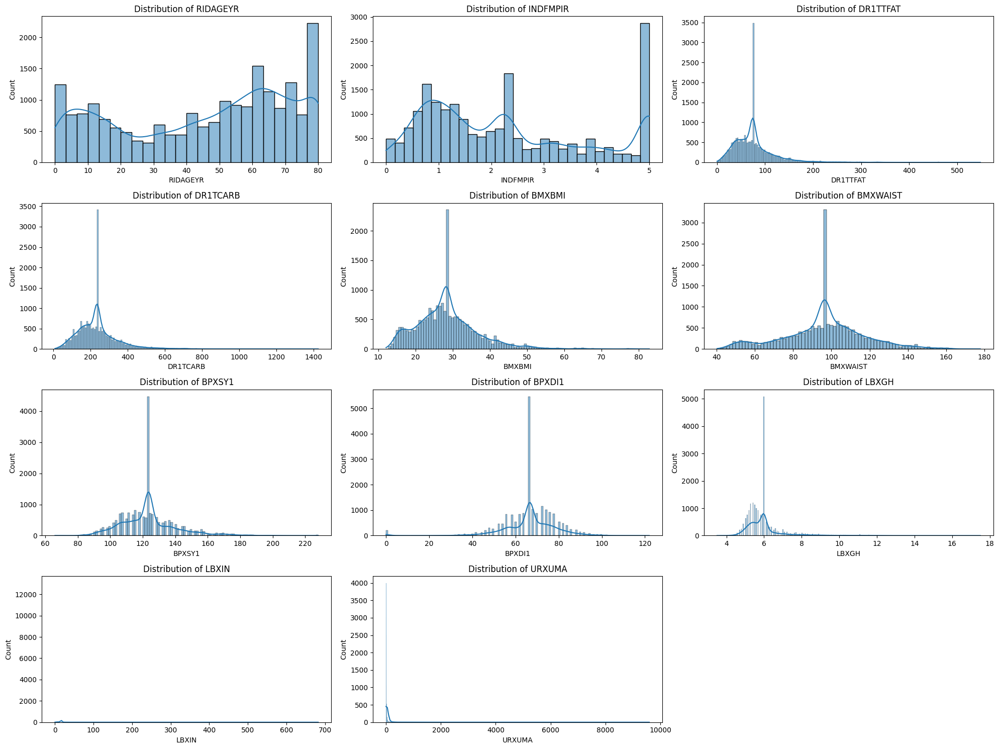

In [24]:
# List of continuous variables in your dataset
continuous_vars = ['RIDAGEYR', 'INDFMPIR', 'DR1TTFAT', 'DR1TCARB', 
                   'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1', 
                   'LBXGH', 'LBXIN', 'URXUMA']

# Plot histograms
plt.figure(figsize=(20, 15))
for i, col in enumerate(continuous_vars, 1):
    plt.subplot(4, 3, i)
    sns.histplot(merged_df[col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

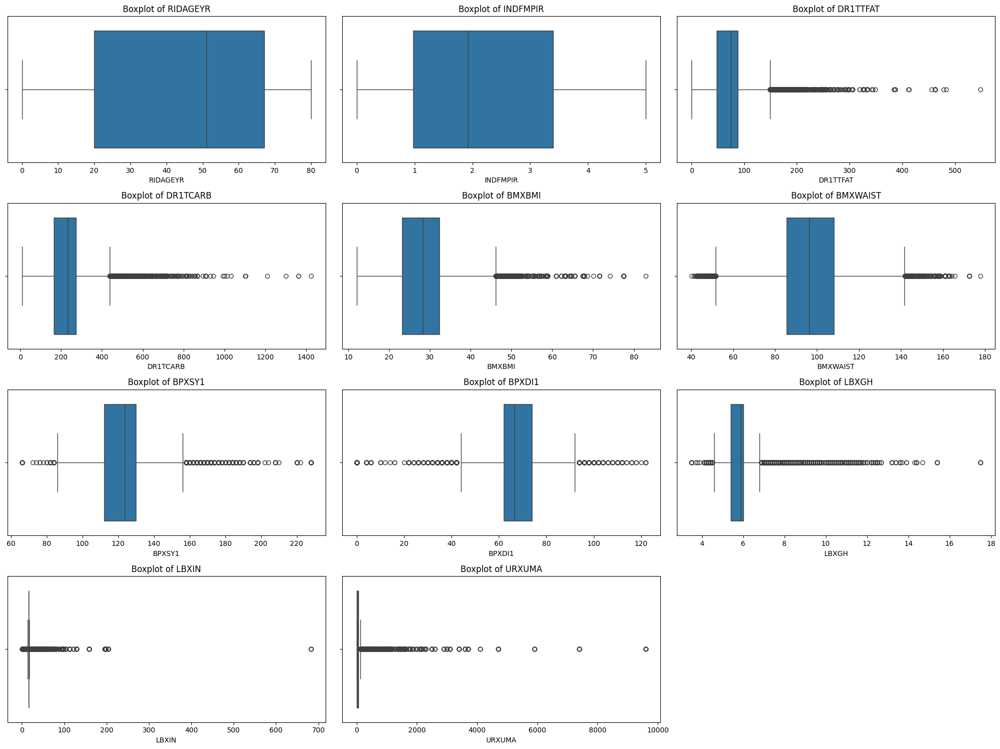

In [25]:
# Plot boxplots
plt.figure(figsize=(20, 15))
for i, col in enumerate(continuous_vars, 1):
    plt.subplot(4, 3, i)
    sns.boxplot(x=merged_df[col].dropna())
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

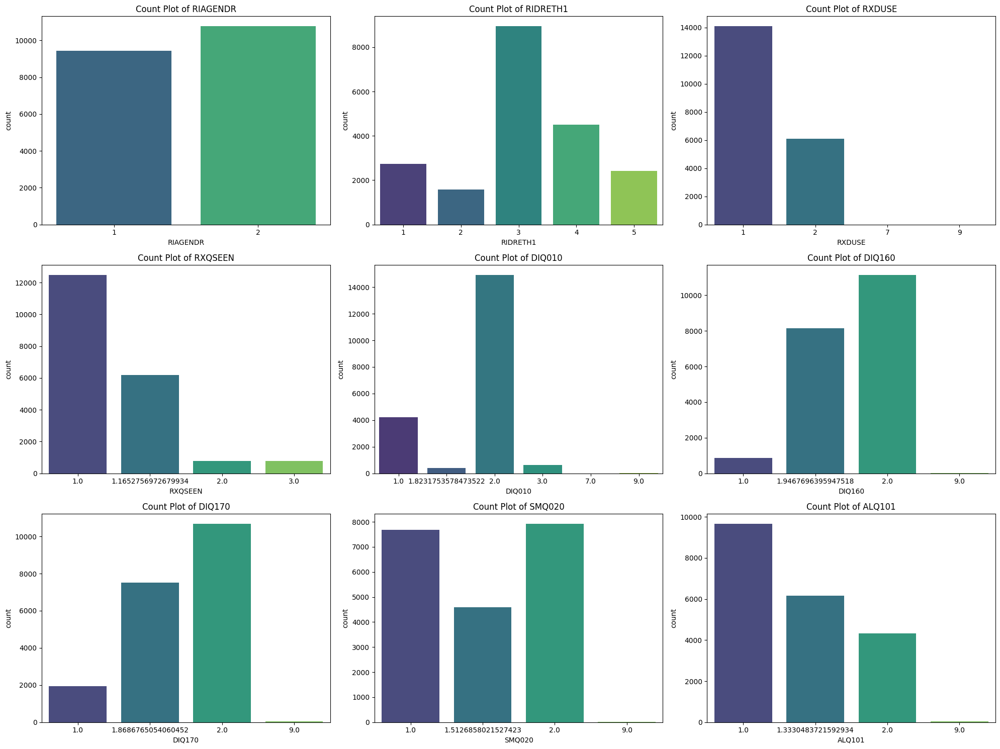

In [26]:
# List of categorical variables in your dataset
categorical_vars = ['RIAGENDR', 'RIDRETH1', 'RXDUSE', 'RXQSEEN', 
                    'DIQ010', 'DIQ160', 'DIQ170', 'SMQ020', 'ALQ101']

# Plot count plots
plt.figure(figsize=(20, 15))
for i, col in enumerate(categorical_vars, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x=merged_df[col], palette='viridis')
    plt.title(f'Count Plot of {col}')
plt.tight_layout()
plt.show()

In [27]:
# Summary statistics for continuous variables
summary_stats = merged_df[continuous_vars].describe()
print(summary_stats)

           RIDAGEYR      INDFMPIR      DR1TTFAT      DR1TCARB        BMXBMI  \
count  20194.000000  20194.000000  20194.000000  20194.000000  20194.000000   
mean      45.373329      2.266655     74.612997    234.928617     28.415333   
std       25.661984      1.542620     42.079311    111.157232      8.208375   
min        0.000000      0.000000      0.000000      8.670000     12.100000   
25%       20.000000      0.980000     47.440000    164.377500     23.200000   
50%       51.000000      1.930000     74.410000    234.928617     28.300000   
75%       67.000000      3.400000     88.010000    274.240000     32.400000   
max       80.000000      5.000000    548.380000   1423.870000     82.900000   

           BMXWAIST        BPXSY1        BPXDI1         LBXGH         LBXIN  \
count  20194.000000  20194.000000  20194.000000  20194.000000  20194.000000   
mean      96.306345    123.534538     66.623712      5.986091     16.393365   
std       21.085727     17.447779     12.981578    

## Bivariate Analysis
Bivariate analysis involves exploring the relationships between two variables, often between features and the target variable. This step helps in identifying patterns, correlations, and potential predictors for your model.

Key Steps in Bivariate Analysis:
* **Continuous vs. Continuous**: Use scatter plots and correlation coefficients to examine relationships between two continuous variables.
* **Categorical vs. Continuous**: Use box plots or violin plots to explore how a continuous variable varies across different categories.
* **Categorical vs. Categorical**: Use cross-tabulations, heatmaps, or bar plots to explore the relationship between two categorical variables.

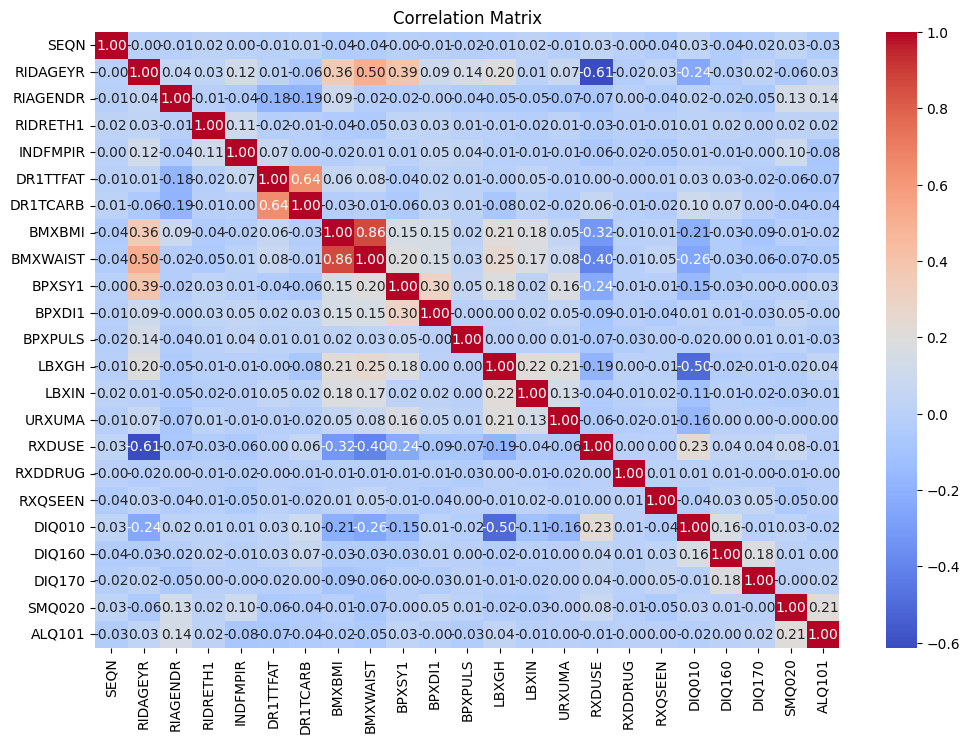

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(merged_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

Continuous vs. Continuous: 


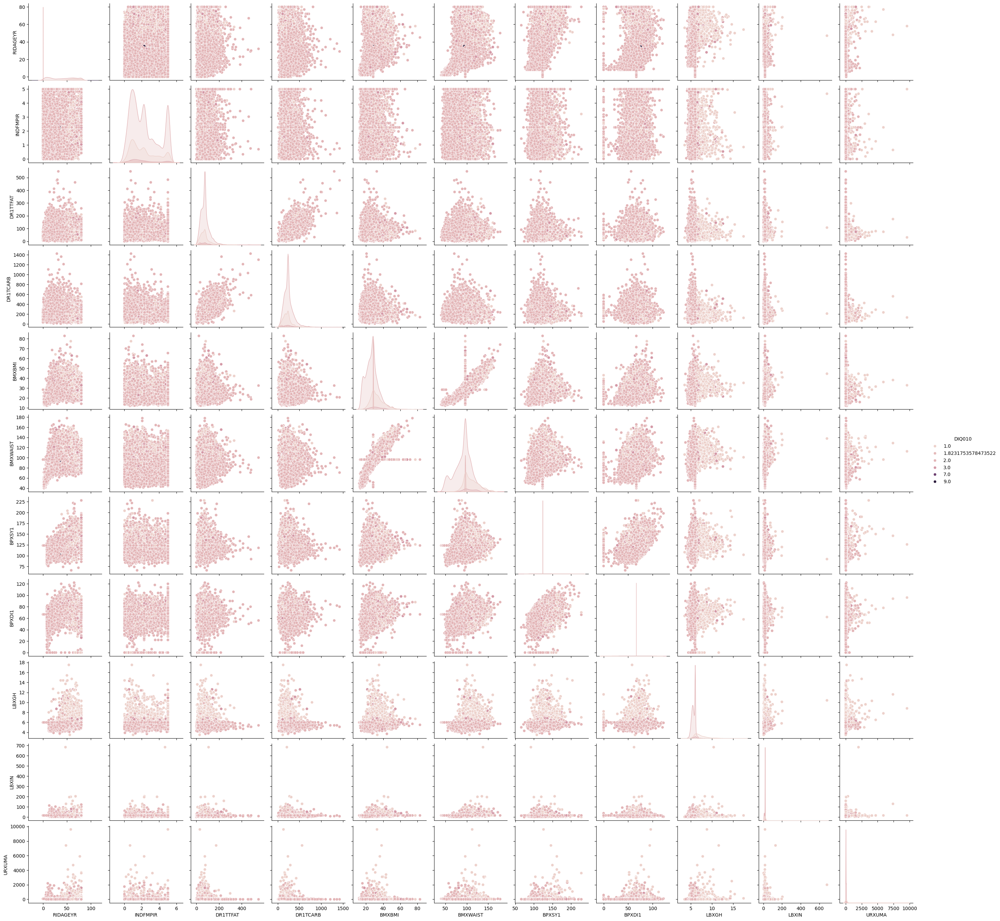

In [29]:
# Scatter plots for pairs of continuous variables
sns.pairplot(merged_df, vars=continuous_vars, hue='DIQ010', diag_kind='kde')
print("Continuous vs. Continuous: ")
plt.show()

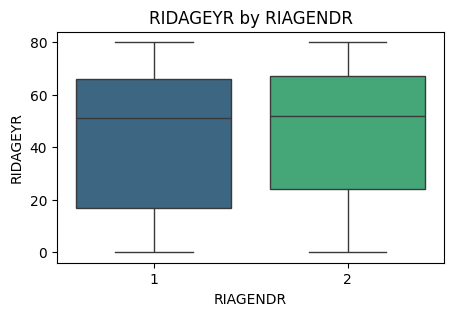

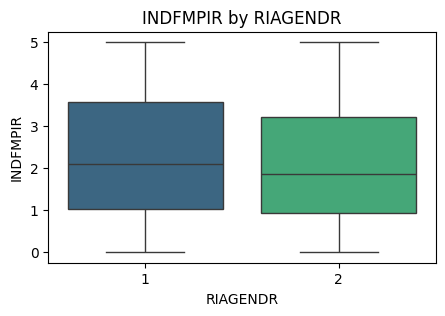

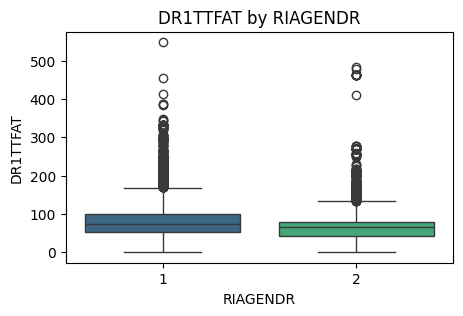

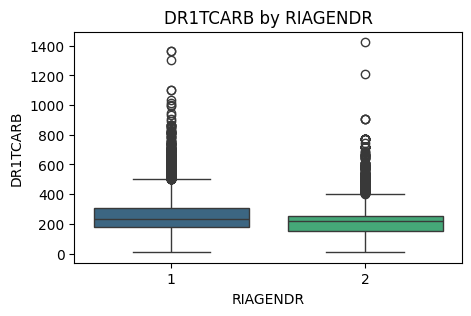

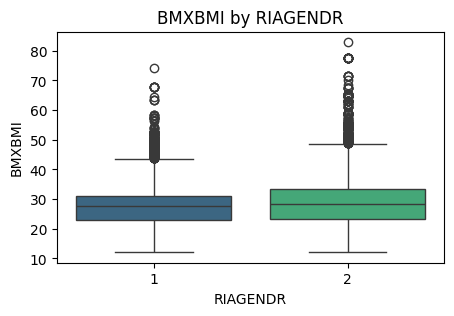

...

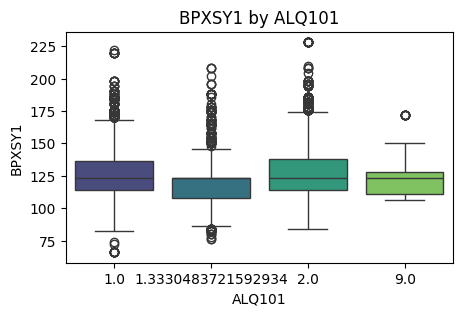

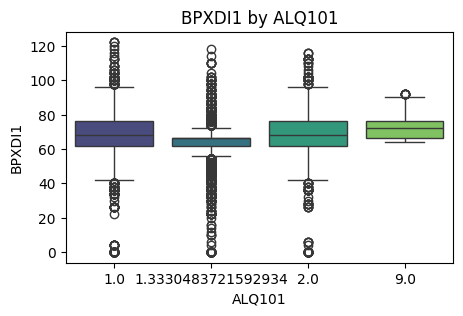

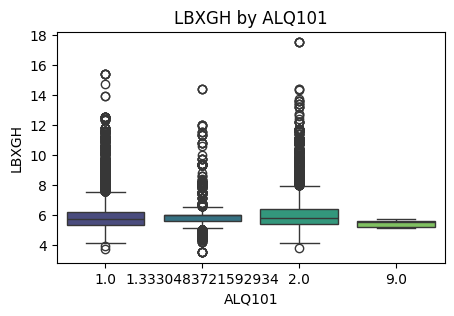

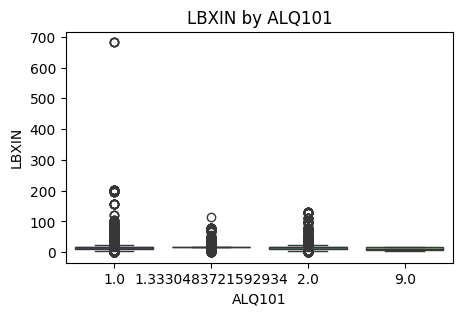

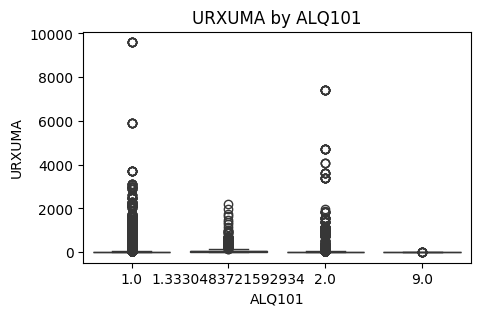

In [30]:
# Boxplot for categorical vs continuous
for cat_col in categorical_vars:
    for cont_col in continuous_vars:
        plt.figure(figsize=(5, 3))
        sns.boxplot(x=merged_df[cat_col], y=merged_df[cont_col], palette='viridis')
        plt.title(f'{cont_col} by {cat_col}')
        plt.show()

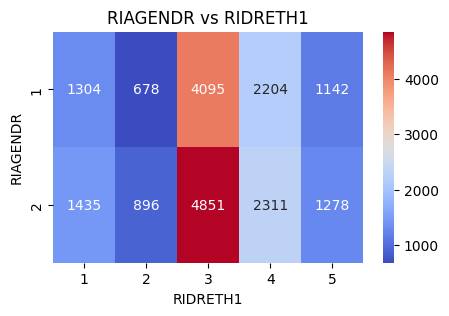

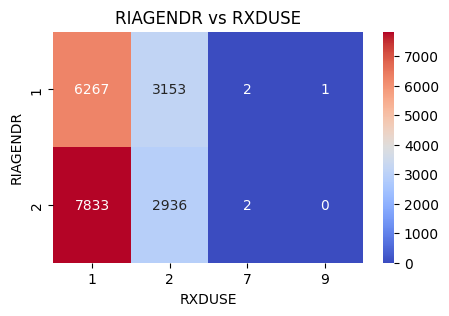

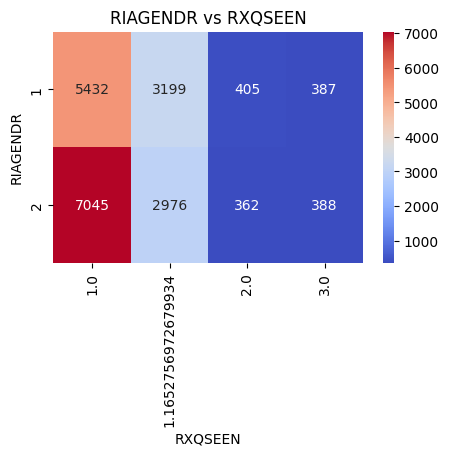

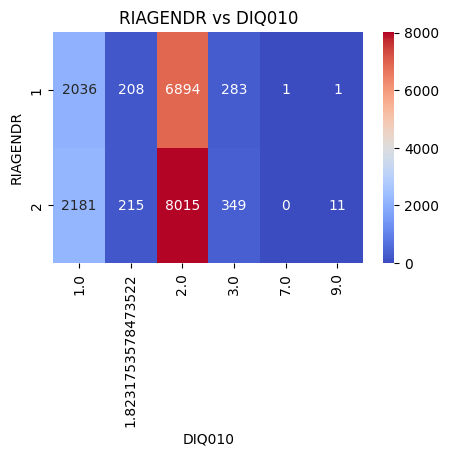

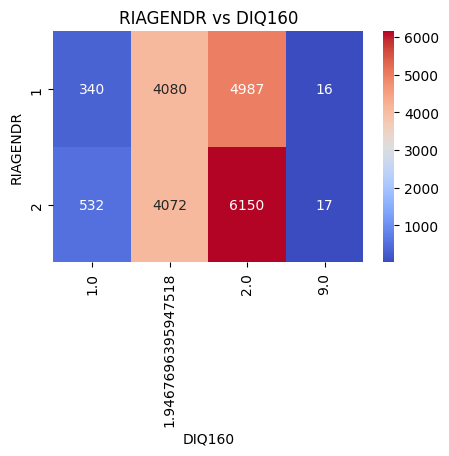

...

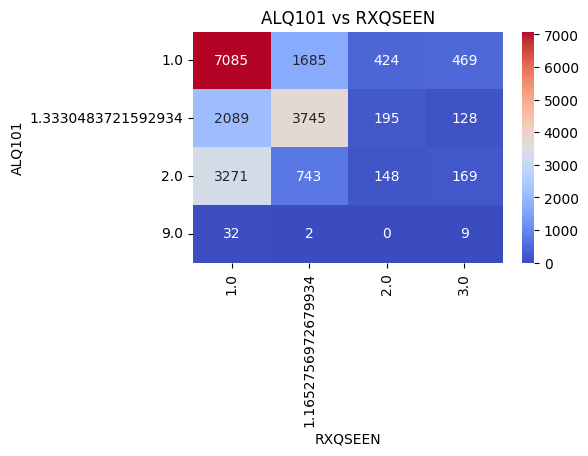

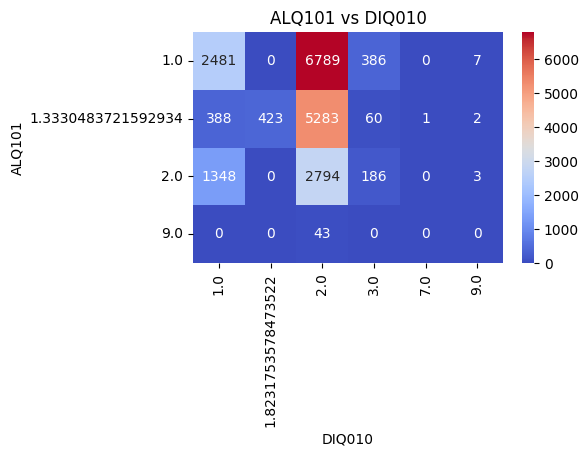

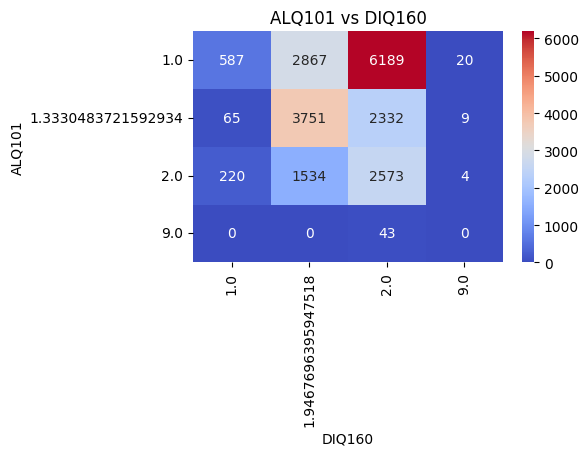

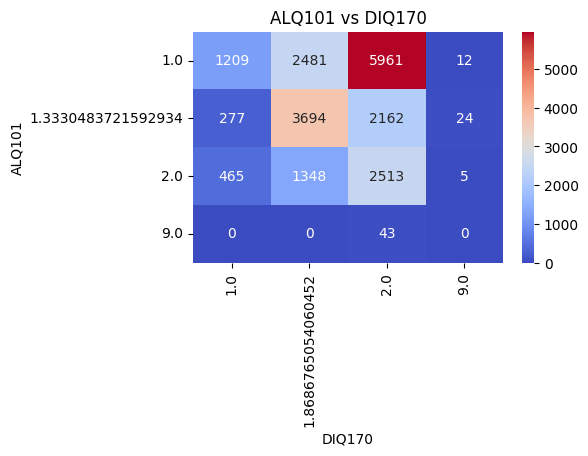

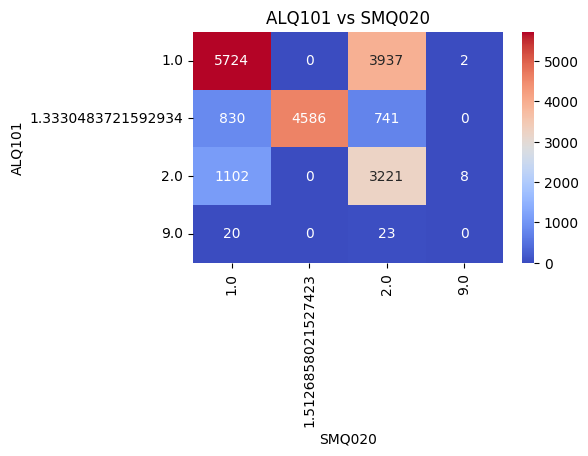

In [31]:
# Cross-tabulation and heatmap for categorical vs categorical
for cat_col1 in categorical_vars:
    for cat_col2 in categorical_vars:
        if cat_col1 != cat_col2:
            crosstab = pd.crosstab(merged_df[cat_col1], merged_df[cat_col2])
            plt.figure(figsize=(5, 3))
            sns.heatmap(crosstab, annot=True, cmap='coolwarm', fmt='d')
            plt.title(f'{cat_col1} vs {cat_col2}')
            plt.show()

In [32]:
# Handling categorical variables (One-Hot Encoding)
categorical_features = ['RIAGENDR', 'RIDRETH1', 'RXDUSE', 'RXQSEEN', 'DIQ160', 'DIQ170', 'SMQ020', 'ALQ101']
one_hot_encoder = OneHotEncoder(drop='first')

# Scaling continuous features
continuous_features = ['RIDAGEYR', 'INDFMPIR', 'DR1TTFAT', 'DR1TCARB', 'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1', 'LBXGH', 'LBXIN', 'URXUMA']
scaler = StandardScaler()

# Creating a ColumnTransformer to apply transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', one_hot_encoder, categorical_features),
        ('num', scaler, continuous_features)
    ])

# Applying transformations
merged_df_transformed = preprocessor.fit_transform(merged_df)

# Adding new features
merged_df['BMI_Category'] = pd.cut(merged_df['BMXBMI'], bins=[0, 18.5, 24.9, 29.9, np.inf], labels=['Underweight', 'Normal', 'Overweight', 'Obese'])
merged_df['Age_Group'] = pd.cut(merged_df['RIDAGEYR'], bins=[0, 18, 35, 50, 65, np.inf], labels=['Child', 'Young Adult', 'Adult', 'Middle-Aged', 'Senior'])
merged_df['Hypertension'] = np.where((merged_df['BPXSY1'] > 130) | (merged_df['BPXDI1'] > 80), 1, 0)

# Example of feature interaction
merged_df['BMI_Waist'] = merged_df['BMXBMI'] * merged_df['BMXWAIST']
merged_df['Chol_Gluc_Interaction'] = merged_df['LBXGH'] * merged_df['LBXIN']

# Log transformation
merged_df['Log_Waist'] = np.log1p(merged_df['BMXWAIST'])
merged_df['Log_Glucose'] = np.log1p(merged_df['LBXIN'])

# Display the updated DataFrame
print(merged_df.head())

    SEQN  RIDAGEYR  RIAGENDR  RIDRETH1  INDFMPIR  DR1TTFAT  DR1TCARB  BMXBMI  \
0  73557        69         1         4      0.84     52.81    239.59    26.7   
1  73557        69         1         4      0.84     52.81    239.59    26.7   
2  73558        54         1         3      1.78    124.29    423.78    28.6   
3  73558        54         1         3      1.78    124.29    423.78    28.6   
4  73558        54         1         3      1.78    124.29    423.78    28.6   

   BMXWAIST  BPXSY1  ...    DIQ170  SMQ020  ALQ101  BMI_Category    Age_Group  \
0     100.0   122.0  ...  1.868677     1.0     1.0    Overweight       Senior   
1     100.0   122.0  ...  1.868677     1.0     1.0    Overweight       Senior   
2     107.6   156.0  ...  1.868677     1.0     1.0    Overweight  Middle-Aged   
3     107.6   156.0  ...  1.868677     1.0     1.0    Overweight  Middle-Aged   
4     107.6   156.0  ...  1.868677     1.0     1.0    Overweight  Middle-Aged   

   Hypertension  BMI_Waist  Chol

# MODEL SELECTION

## Decision Tree

In [33]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance (Optional)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate Decision Tree Model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred = dt_model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

Decision Tree Accuracy: 0.98
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2990
         1.0       0.93      0.99      0.96       836

    accuracy                           0.98      3826
   macro avg       0.97      0.99      0.98      3826
weighted avg       0.98      0.98      0.98      3826



## Random Forest

In [34]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance (Optional)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate Random Forest Model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred = rf_model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

Random Forest Accuracy: 0.99
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2990
         1.0       0.98      0.99      0.99       836

    accuracy                           0.99      3826
   macro avg       0.99      0.99      0.99      3826
weighted avg       0.99      0.99      0.99      3826



## Gradient Boosting

In [35]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance (Optional)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate Gradient Boosting Model
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred = gb_model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Gradient Boosting Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

Gradient Boosting Accuracy: 0.90
              precision    recall  f1-score   support

         0.0       0.97      0.90      0.94      2990
         1.0       0.72      0.89      0.80       836

    accuracy                           0.90      3826
   macro avg       0.85      0.90      0.87      3826
weighted avg       0.91      0.90      0.91      3826



## Support Vector Machine [Kernel = Linear, Poly, RBF, Sigmoid]

In [36]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance (Optional)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate SVM Models with Different Kernels
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
svm_results = {}

for kernel in kernels:
    print(f"\nSVM with {kernel} kernel:")
    svm_model = SVC(kernel=kernel, probability=False, random_state=42)
    svm_model.fit(X_resampled, y_resampled)
    
    # Make predictions
    y_pred = svm_model.predict(X_test_scaled)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    svm_results[kernel] = accuracy
    print(f"Accuracy: {accuracy:.2f}")
    print(classification_report(y_test, y_pred))

# Display SVM results
print("\nSVM Kernel Accuracies:")
for kernel, accuracy in svm_results.items():
    print(f"{kernel} kernel: {accuracy:.2f}")


SVM with linear kernel:
Accuracy: 0.87
              precision    recall  f1-score   support

         0.0       0.95      0.88      0.91      2990
         1.0       0.66      0.85      0.74       836

    accuracy                           0.87      3826
   macro avg       0.81      0.86      0.83      3826
weighted avg       0.89      0.87      0.88      3826


SVM with poly kernel:
Accuracy: 0.89
              precision    recall  f1-score   support

         0.0       0.95      0.91      0.93      2990
         1.0       0.72      0.84      0.77       836

    accuracy                           0.89      3826
   macro avg       0.83      0.87      0.85      3826
weighted avg       0.90      0.89      0.90      3826


SVM with rbf kernel:
Accuracy: 0.89
              precision    recall  f1-score   support

         0.0       0.97      0.88      0.92      2990
         1.0       0.68      0.90      0.78       836

    accuracy                           0.89      3826
   macro avg 

## K Nearest Neighbors

In [37]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance (Optional)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate KNN Models with Different n_neighbors
neighbors = [3, 5, 10]
knn_results = {}

for n in neighbors:
    print(f"\nKNN with {n} neighbors:")
    knn_model = KNeighborsClassifier(n_neighbors=n)
    knn_model.fit(X_resampled, y_resampled)
    
    # Make predictions
    y_pred = knn_model.predict(X_test_scaled)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    knn_results[n] = accuracy
    print(f"Accuracy: {accuracy:.2f}")
    print(classification_report(y_test, y_pred))

# Display KNN results
print("\nKNN Accuracies with Different n_neighbors:")
for n, accuracy in knn_results.items():
    print(f"{n} neighbors: {accuracy:.2f}")


KNN with 3 neighbors:
Accuracy: 0.98
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      2990
         1.0       0.91      0.99      0.95       836

    accuracy                           0.98      3826
   macro avg       0.95      0.98      0.96      3826
weighted avg       0.98      0.98      0.98      3826


KNN with 5 neighbors:
Accuracy: 0.96
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2990
         1.0       0.87      0.98      0.92       836

    accuracy                           0.96      3826
   macro avg       0.93      0.97      0.95      3826
weighted avg       0.97      0.96      0.96      3826


KNN with 10 neighbors:
Accuracy: 0.94
              precision    recall  f1-score   support

         0.0       0.99      0.94      0.96      2990
         1.0       0.81      0.97      0.88       836

    accuracy                           0.94      3826
   macro avg 

## Logistic Regression

In [38]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate Logistic Regression Model
print("\nLogistic Regression:")
log_reg = LogisticRegression(max_iter=2000, class_weight='balanced', random_state=42)
log_reg.fit(X_resampled, y_resampled)

# Make predictions
y_pred = log_reg.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))


Logistic Regression:
Accuracy: 0.86
              precision    recall  f1-score   support

         0.0       0.96      0.86      0.91      2990
         1.0       0.64      0.87      0.74       836

    accuracy                           0.86      3826
   macro avg       0.80      0.86      0.82      3826
weighted avg       0.89      0.86      0.87      3826



## Feed Forward Neural Networks

In [39]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Select features and target
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN', 
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]
y = merged_df['DIQ010']

# Encode the target variable (1 for diabetes, 0 for no diabetes)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the Feedforward Neural Network
model = Sequential()
model.add(Dense(64, input_dim=X_train_scaled.shape[1], activation='relu'))  # Input layer and first hidden layer
model.add(Dense(32, activation='relu'))  # Second hidden layer
model.add(Dense(16, activation='relu'))  # Third hidden layer
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test))

# Evaluate the model
y_pred = model.predict(X_test_scaled).round()
print("Feedforward Neural Network:")
print(classification_report(y_test, y_pred, zero_division=1))

# Model Summary
model.summary()

2024-09-01 17:34:49.812031: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-01 17:34:49.812143: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-01 17:34:49.926502: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
 96/505 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0331 - loss: -0.7853

I0000 00:00:1725212102.698732      86 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


505/505 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.0339 - loss: -1085.9524 - val_accuracy: 0.0862 - val_loss: -32445.8477
Epoch 2/50
505/505 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0889 - loss: -100998.6562 - val_accuracy: 0.1040 - val_loss: -545307.1250
Epoch 3/50
505/505 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1066 - loss: -896809.5625 - val_accuracy: 0.1084 - val_loss: -2562263.7500
Epoch 4/50
505/505 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0976 - loss: -3409070.2500 - val_accuracy: 0.1112 - val_loss: -7241405.0000
Epoch 5/50
505/505 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0962 - loss: -9041390.0000 - val_accuracy: 0.0963 - val_loss: -15642720.0000
Epoch 6/50
505/505 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0987 - loss: -18327416.0000 - val_accuracy: 0.0914 - val_loss: -28964878.0000
Epoch 7/50
505/505 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.0864 - loss: -32944944.0000 - val_accuracy: 0.1208 - val_loss: -48113768.0000
Epoch 8/50
505/505 ━

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,989 (39.02 KB)

 Trainable params: 3,329 (13.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,660 (26.02 KB)

In [40]:
# Evaluate the model on the test data to get loss and accuracy
loss, accuracy = model.evaluate(X_test_scaled, y_test)

# Print the accuracy
print(f"Feedforward Neural Network Accuracy: {accuracy:.2f}")

127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1288 - loss: -26576623616.0000
Feedforward Neural Network Accuracy: 0.13


## Multi Layer Perceptron

In [41]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score

# Select features and target
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN', 
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]
y = merged_df['DIQ010']

# Encode the target variable (1 for diabetes, 0 for no diabetes)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the MLP model
mlp = MLPClassifier(hidden_layer_sizes=(64, 32, 16), activation='relu', solver='adam', max_iter=200, random_state=42)
mlp.fit(X_train_scaled, y_train)

# Make predictions
y_pred = mlp.predict(X_test_scaled)

# Print classification report
print("Multilayer Perceptron (MLP):")
print(classification_report(y_test, y_pred, zero_division=1))

# Calculate and print the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Multilayer Perceptron (MLP) Accuracy: {accuracy:.2f}")

Multilayer Perceptron (MLP):
              precision    recall  f1-score   support

           0       0.93      0.98      0.95       828
           1       0.88      0.86      0.87        95
           2       0.98      0.98      0.98      2978
           3       0.91      0.67      0.77       136
           5       1.00      0.00      0.00         2

    accuracy                           0.96      4039
   macro avg       0.94      0.70      0.71      4039
weighted avg       0.96      0.96      0.96      4039

Multilayer Perceptron (MLP) Accuracy: 0.96


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


## Plotting and comparing the accuracies of each algorithm and neural model

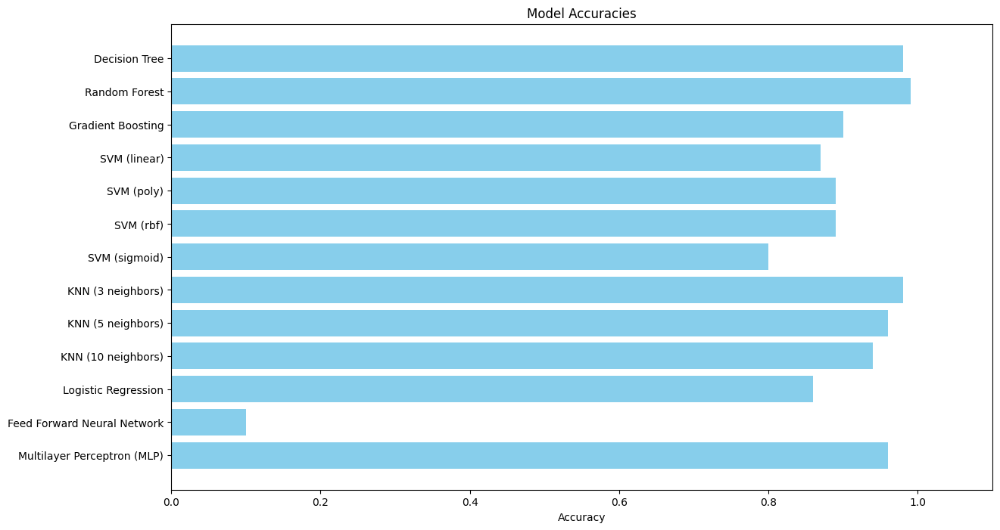

In [42]:
import matplotlib.pyplot as plt

# Dictionary of accuracies for different models
accuracies = {
    'Decision Tree': 0.98,
    'Random Forest': 0.99,
    'Gradient Boosting': 0.90,
    'SVM (linear)': 0.87,
    'SVM (poly)': 0.89,
    'SVM (rbf)': 0.89,
    'SVM (sigmoid)': 0.80,
    'KNN (3 neighbors)': 0.98,
    'KNN (5 neighbors)': 0.96,
    'KNN (10 neighbors)': 0.94,
    'Logistic Regression': 0.86,
    'Feed Forward Neural Network': 0.10,
    'Multilayer Perceptron (MLP)': 0.96
}

# Convert the dictionary to lists for plotting
models = list(accuracies.keys())
scores = list(accuracies.values())

# Plotting the bar chart
plt.figure(figsize=(14, 8))
plt.barh(models, scores, color='skyblue')
plt.xlabel('Accuracy')
plt.title('Model Accuracies')
plt.xlim(0, 1.1)  # Set x-axis limit from 0 to 1.1 to give some space for the bars
plt.gca().invert_yaxis()  # To display the highest accuracy at the top
plt.show()

## Saving the merged dataframe for reference

In [43]:
import pandas as pd

# Save the first few rows of merged_df to an Excel file
file_path = '/kaggle/working/merged_df.xlsx'
merged_df.to_excel(file_path, index=False)

print(f"File saved as {file_path}")

File saved as /kaggle/working/merged_df.xlsx


# PREDICTING THE DIABETES 
Here we are predicting the diabetes by passing through each and every models and we have also set the threshold value of the glucose and insulin of our merged dataframe in which we have taken the important features to predict the diabetes.

The glucose and insulin into the merged dataframe have the feature name of: LBXGLU & LBXIN. Here, we know that the LBXGLU is not the glucose level it is the Glycohemoglobin or HbA1C. So, for an HbA1c test to classify as normal, or in the non-diabetic range, the value must be below 5.7 %. Anyone with an HbA1c value of 5.7 % to 6.4 % is considered to be prediabetic, while diabetes can be diagnosed with a HbA1c of 6.5% or higher.

For LBXIN: Less than 10 uIU/mL is often seen as optimal or ideal. Less than 20 uIU/mL is considered good. Around 25-35 uIU/mL is typically regarded as fair. Above 40 uIU/mL could indicate early insulin resistance.

We have make an threshold value:
LBXGLU = 6.5
LBXIN = 10 or 15 [we will check for both the values]

## Predicting the Diabetes [LBXGLU = 6.5 & LBXIN = 15]

In [44]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from sklearn.neural_network import MLPClassifier

# Assume X_train, y_train, X_test, y_test are already defined
# Assume X_resampled, y_resampled for SMOTE are already defined
# Assume the models are already trained and accuracies are stored in 'accuracies' dictionary

# Define a function to create a feedforward neural network
def create_ffnn(input_dim):
    model = Sequential()
    model.add(Input(shape=(input_dim,)))
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Build and train the Feedforward Neural Network
ffnn_model = create_ffnn(X_train.shape[1])
ffnn_model.fit(X_resampled, y_resampled, epochs=50, batch_size=10, verbose=0)

# Build and train the Multilayer Perceptron model
mlp_model = MLPClassifier(random_state=42)
mlp_model.fit(X_resampled, y_resampled)

# Example new data point (replace these values with real data)
new_data_point = np.array([[50, 28.7, 90, 120, 15, 70, 300,3.03, 120, 80]])

# Standardize the new data point using the scaler fitted on the training data
scaler = StandardScaler().fit(X_train)
new_data_point_scaled = scaler.transform(new_data_point)

# Dictionary to store predictions and their corresponding accuracies
model_predictions = {}
model_accuracies = {}

# Define the models
models = {
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Feed Forward Neural Network': ffnn_model,
    'Multilayer Perceptron (MLP)': mlp_model
}

# Train and predict with each model
for model_name, model in models.items():
    if model_name != 'Feed Forward Neural Network':
        model.fit(X_resampled, y_resampled)
    if model_name == 'Feed Forward Neural Network':
        prediction = (model.predict(new_data_point_scaled) > 0.5).astype(int)
    else:
        prediction = model.predict(new_data_point_scaled)
    model_predictions[model_name] = prediction[0]  # Storing the prediction
    model_accuracies[model_name] = accuracies[model_name]

# For SVM models with different kernels
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
for kernel in kernels:
    svm_model = SVC(kernel=kernel, probability=False, random_state=42)
    svm_model.fit(X_resampled, y_resampled)
    prediction = svm_model.predict(new_data_point_scaled)
    model_predictions[f'SVM ({kernel})'] = prediction[0]
    model_accuracies[f'SVM ({kernel})'] = accuracies[f'SVM ({kernel})']

# For KNN models with different neighbors
neighbors = [3, 5, 10]
for n in neighbors:
    knn_model = KNeighborsClassifier(n_neighbors=n)
    knn_model.fit(X_resampled, y_resampled)
    prediction = knn_model.predict(new_data_point_scaled)
    model_predictions[f'KNN ({n} neighbors)'] = prediction[0]
    model_accuracies[f'KNN ({n} neighbors)'] = accuracies[f'KNN ({n} neighbors)']

# Define thresholds for glucose and insulin
glucose_threshold = 6.5
insulin_threshold = 15 

# Modify predictions based on glucose and insulin levels
for model_name, prediction in model_predictions.items():
    # Check if the glucose or insulin levels are above the threshold
    if new_data_point[0][3] > glucose_threshold or new_data_point[0][4] > insulin_threshold:
        model_predictions[model_name] = 1  # Override to 'Diabetes' if thresholds are exceeded

# Map the predictions to diabetes status
diabetes_mapping = {0: 'No Diabetes', 1: 'Diabetes'}

# Print the predictions and their accuracies
for model_name in model_predictions:
    predicted_label = diabetes_mapping.get(model_predictions[model_name], 'Unknown')
    print(f"{model_name} predicts: {predicted_label} with accuracy {model_accuracies[model_name]}")

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Decision Tree predicts: Diabetes with accuracy 0.98
Random Forest predicts: Diabetes with accuracy 0.99
Gradient Boosting predicts: Diabetes with accuracy 0.9
Logistic Regression predicts: Diabetes with accuracy 0.86
Feed Forward Neural Network predicts: Diabetes with accuracy 0.1
Multilayer Perceptron (MLP) predicts: Diabetes with accuracy 0.96
SVM (linear) predicts: Diabetes with accuracy 0.87
SVM (poly) predicts: Diabetes with accuracy 0.89
SVM (rbf) predicts: Diabetes with accuracy 0.89
SVM (sigmoid) predicts: Diabetes with accuracy 0.8
KNN (3 neighbors) predicts: Diabetes with accuracy 0.98
KNN (5 neighbors) predicts: Diabetes with accuracy 0.96
KNN (10 neighbors) predicts: Diabetes with accuracy 0.94


## Predicting the Diabetes [LBXGLU = 6.5 & LBXIN = 10]

In [45]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from sklearn.neural_network import MLPClassifier

# Assume X_train, y_train, X_test, y_test are already defined
# Assume X_resampled, y_resampled for SMOTE are already defined
# Assume the models are already trained and accuracies are stored in 'accuracies' dictionary

# Define a function to create a feedforward neural network
def create_ffnn(input_dim):
    model = Sequential()
    model.add(Input(shape=(input_dim,)))
    model.add(Dense(128, input_dim=input_dim, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Build and train the Feedforward Neural Network
ffnn_model = create_ffnn(X_train.shape[1])
ffnn_model.fit(X_resampled, y_resampled, epochs=50, batch_size=10, verbose=0)

# Build and train the Multilayer Perceptron model
mlp_model = MLPClassifier(random_state=42)
mlp_model.fit(X_resampled, y_resampled)

# Example new data point (replace these values with real data)
new_data_point = np.array([[50, 28.7, 90, 120, 15, 70, 300,3.03, 120, 80]])

# Standardize the new data point using the scaler fitted on the training data
scaler = StandardScaler().fit(X_train)
new_data_point_scaled = scaler.transform(new_data_point)

# Dictionary to store predictions and their corresponding accuracies
model_predictions = {}
model_accuracies = {}

# Define the models
models = {
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Feed Forward Neural Network': ffnn_model,
    'Multilayer Perceptron (MLP)': mlp_model
}

# Train and predict with each model
for model_name, model in models.items():
    if model_name != 'Feed Forward Neural Network':
        model.fit(X_resampled, y_resampled)
    if model_name == 'Feed Forward Neural Network':
        prediction = (model.predict(new_data_point_scaled) > 0.5).astype(int)
    else:
        prediction = model.predict(new_data_point_scaled)
    model_predictions[model_name] = prediction[0]  # Storing the prediction
    model_accuracies[model_name] = accuracies[model_name]

# For SVM models with different kernels
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
for kernel in kernels:
    svm_model = SVC(kernel=kernel, probability=False, random_state=42)
    svm_model.fit(X_resampled, y_resampled)
    prediction = svm_model.predict(new_data_point_scaled)
    model_predictions[f'SVM ({kernel})'] = prediction[0]
    model_accuracies[f'SVM ({kernel})'] = accuracies[f'SVM ({kernel})']

# For KNN models with different neighbors
neighbors = [3, 5, 10]
for n in neighbors:
    knn_model = KNeighborsClassifier(n_neighbors=n)
    knn_model.fit(X_resampled, y_resampled)
    prediction = knn_model.predict(new_data_point_scaled)
    model_predictions[f'KNN ({n} neighbors)'] = prediction[0]
    model_accuracies[f'KNN ({n} neighbors)'] = accuracies[f'KNN ({n} neighbors)']

# Define thresholds for glucose and insulin
glucose_threshold = 6.5
insulin_threshold = 10

# Modify predictions based on glucose and insulin levels
for model_name, prediction in model_predictions.items():
    # Check if the glucose or insulin levels are above the threshold
    if new_data_point[0][3] > glucose_threshold or new_data_point[0][4] > insulin_threshold:
        model_predictions[model_name] = 1  # Override to 'Diabetes' if thresholds are exceeded

# Map the predictions to diabetes status
diabetes_mapping = {0: 'No Diabetes', 1: 'Diabetes'}

# Print the predictions and their accuracies
for model_name in model_predictions:
    predicted_label = diabetes_mapping.get(model_predictions[model_name], 'Unknown')
    print(f"{model_name} predicts: {predicted_label} with accuracy {model_accuracies[model_name]}")

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Decision Tree predicts: Diabetes with accuracy 0.98
Random Forest predicts: Diabetes with accuracy 0.99
Gradient Boosting predicts: Diabetes with accuracy 0.9
Logistic Regression predicts: Diabetes with accuracy 0.86
Feed Forward Neural Network predicts: Diabetes with accuracy 0.1
Multilayer Perceptron (MLP) predicts: Diabetes with accuracy 0.96
SVM (linear) predicts: Diabetes with accuracy 0.87
SVM (poly) predicts: Diabetes with accuracy 0.89
SVM (rbf) predicts: Diabetes with accuracy 0.89
SVM (sigmoid) predicts: Diabetes with accuracy 0.8
KNN (3 neighbors) predicts: Diabetes with accuracy 0.98
KNN (5 neighbors) predicts: Diabetes with accuracy 0.96
KNN (10 neighbors) predicts: Diabetes with accuracy 0.94


# TYPE-1 DIABETES PREDICTION [By removing the Missing Values]

## Extracting the features from the NHANES dataset.
- The features that are extracted are: Glycohemoglobin, Insulin and Serum Glucose.

In [46]:
import pandas as pd

# Load the relevant datasets
labs = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/labs.csv', encoding='latin1')

# Extract the required features
selected_features = labs[['LBXGH', 'LBXIN', 'LBXSGL']]

# Save the new DataFrame to a CSV file
selected_features.to_csv('/kaggle/working/type-1_features.csv', index=False)

# Alternatively, save it to an Excel file
selected_features.to_excel('/kaggle/working/selected_features.xlsx', index=False)

print("Type-1 Features saved successfully.")

Type-1 Features saved successfully.


## Cleaning the Missing Values

In [47]:
# Drop rows with missing values in the selected features
df_selected_clean = selected_features.dropna(subset=['LBXGH', 'LBXIN', 'LBXSGL'])

# Verify that the missing values are dropped
print(df_selected_clean.isnull().sum())

LBXGH     0
LBXIN     0
LBXSGL    0
dtype: int64


## Summary of the dataset

In [48]:
# Descriptive statistics for the selected features
eda_summary = df_selected_clean.describe()
print(eda_summary)

             LBXGH        LBXIN      LBXSGL
count  3090.000000  3090.000000  3090.00000
mean      5.640744    13.529434   101.10000
std       0.983292    18.646499    31.67567
min       3.500000     0.140000    49.00000
25%       5.200000     6.080000    88.00000
50%       5.400000     9.475000    94.00000
75%       5.800000    15.335000   102.00000
max      14.700000   682.480000   403.00000


## Correlational Matrix

In [49]:
# Correlation matrix
correlation_matrix = df_selected_clean.corr()
print(correlation_matrix)

           LBXGH     LBXIN    LBXSGL
LBXGH   1.000000  0.230858  0.826790
LBXIN   0.230858  1.000000  0.229025
LBXSGL  0.826790  0.229025  1.000000


## Plotting the Histogram of GlycoHemoglobin, Insulin and Serum Glucose

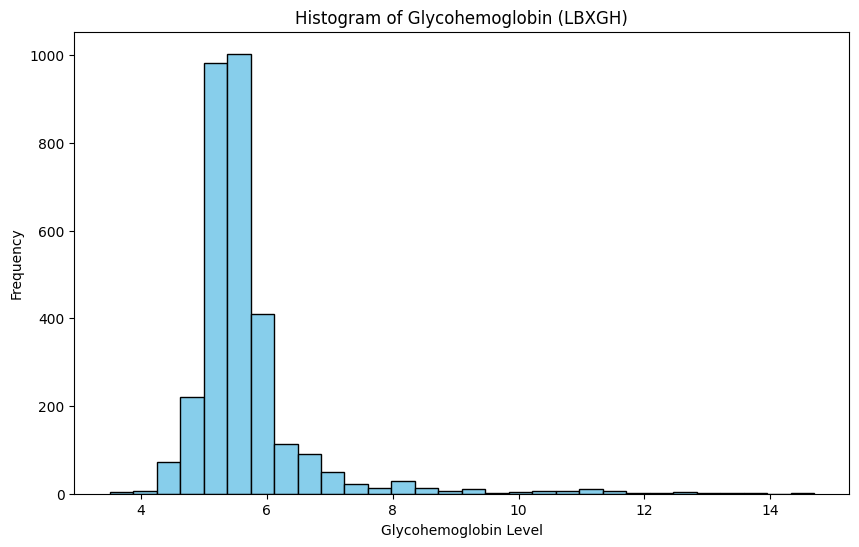

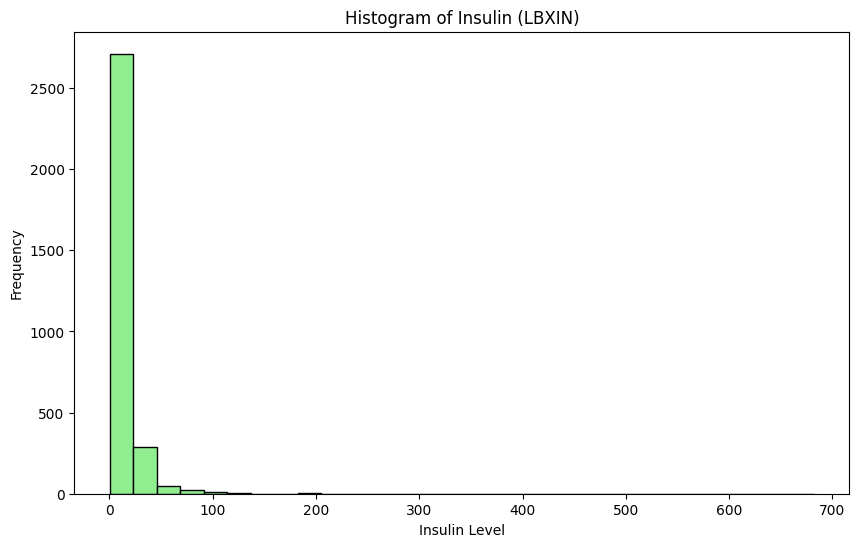

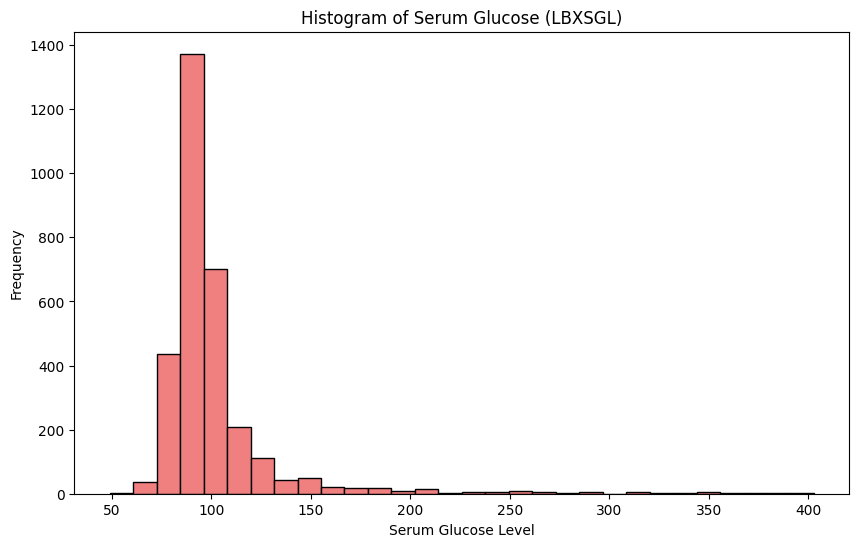

In [50]:
import matplotlib.pyplot as plt

# Histogram for LBXGH
plt.figure(figsize=(10, 6))
plt.hist(df_selected_clean['LBXGH'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Glycohemoglobin (LBXGH)')
plt.xlabel('Glycohemoglobin Level')
plt.ylabel('Frequency')
plt.show()

# Histogram for LBXIN
plt.figure(figsize=(10, 6))
plt.hist(df_selected_clean['LBXIN'], bins=30, color='lightgreen', edgecolor='black')
plt.title('Histogram of Insulin (LBXIN)')
plt.xlabel('Insulin Level')
plt.ylabel('Frequency')
plt.show()

# Histogram for LBXSGL
plt.figure(figsize=(10, 6))
plt.hist(df_selected_clean['LBXSGL'], bins=30, color='lightcoral', edgecolor='black')
plt.title('Histogram of Serum Glucose (LBXSGL)')
plt.xlabel('Serum Glucose Level')
plt.ylabel('Frequency')
plt.show()

## Plotting the Pairplot between three extracted features

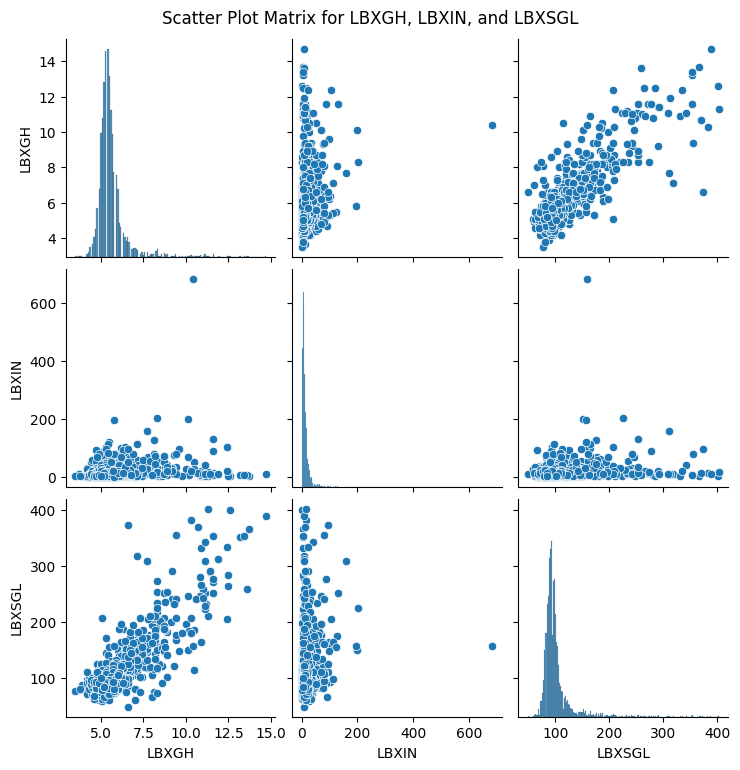

In [51]:
import seaborn as sns

# Pairplot for selected features
sns.pairplot(df_selected_clean[['LBXGH', 'LBXIN', 'LBXSGL']])
plt.suptitle('Scatter Plot Matrix for LBXGH, LBXIN, and LBXSGL', y=1.02)
plt.show()

## Saving the data after removing the missing values as a new dataset

In [52]:
# Save the cleaned DataFrame to a new CSV file
output_file_path = '/kaggle/working/type-1_features_clean.csv'
df_selected_clean.to_csv(output_file_path, index=False)

print(f"Type-1 Cleaned DataFrame saved to: {output_file_path}")

Type-1 Cleaned DataFrame saved to: /kaggle/working/type-1_features_clean.csv


## Decision Tree

In [53]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and Train the Decision Tree Model
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make Predictions on the Test Set
y_pred = clf.predict(X_test)

# Evaluate the Model
print("Decision Tree Classifier:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Decision Tree Classifier:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927



## Random Forest

In [54]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and Train the Random Forest Model
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make Predictions on the Test Set
y_pred = clf.predict(X_test)

# Evaluate the Model
print("Random Forest Classifier:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Random Forest Classifier:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927



## Gradient Boosting

In [55]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and Train the Gradient Boosting Model
clf = GradientBoostingClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make Predictions on the Test Set
y_pred = clf.predict(X_test)

# Evaluate the Model
print("Gradient Boosting Classifier:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Gradient Boosting Classifier:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927



## Support Vector Machine [Kernels: Linear, Poly, RBF, Sigmoid]

In [56]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define a function to train and evaluate SVM models
def train_evaluate_svm(kernel, kernel_name, **kwargs):
    svm = SVC(kernel=kernel, random_state=42, **kwargs)
    svm.fit(X_train, y_train)
    y_pred = svm.predict(X_test)
    print(f"SVM with {kernel_name} kernel:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print("="*50)

# Train and evaluate SVM with different kernels

# Linear Kernel
train_evaluate_svm('linear', 'linear')

# RBF Kernel
train_evaluate_svm('rbf', 'RBF')

# Polynomial Kernel
# You can specify the degree of the polynomial kernel with the 'degree' parameter
train_evaluate_svm('poly', 'polynomial', degree=3)  # Degree can be adjusted

# Sigmoid Kernel
train_evaluate_svm('sigmoid', 'sigmoid')

SVM with linear kernel:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927

SVM with RBF kernel:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927

SVM with polynomial kernel:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg 

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## K Nearest Neighbors [N = 3,5,7,10]

In [57]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define a function to train and evaluate KNN models with different numbers of neighbors
def train_evaluate_knn(n_neighbors):
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    print(f"KNN with {n_neighbors} neighbors:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print("="*50)

# Train and evaluate KNN with different numbers of neighbors
# Common choices: 3, 5, 7, 10
train_evaluate_knn(3)
train_evaluate_knn(5)
train_evaluate_knn(7)
train_evaluate_knn(10)

KNN with 3 neighbors:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927

KNN with 5 neighbors:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927

KNN with 7 neighbors:
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Logistic Regression

In [58]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and Train the Logistic Regression Model
clf = LogisticRegression(random_state=42)
clf.fit(X_train, y_train)

# Make Predictions on the Test Set
y_pred = clf.predict(X_test)

# Evaluate the Model
print("Logistic Regression:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Logistic Regression:
Accuracy: 0.9989212513484358
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       0.00      0.00      0.00         1

    accuracy                           1.00       927
   macro avg       0.50      0.50      0.50       927
weighted avg       1.00      1.00      1.00       927



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Feed Forward Neural Network

In [59]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Standardize the Data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Step 3: Build the Neural Network
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the Model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the Model
history = model.fit(X_train, y_train, epochs=100, batch_size=10, validation_split=0.2, verbose=1)

# Evaluate the Model
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("Neural Network Accuracy:", accuracy)

# Make Predictions on the Test Set
y_pred = (model.predict(X_test) > 0.5).astype(int)

# Evaluate the Model
print("Classification Report:")
print(classification_report(y_test, y_pred))

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


173/173 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9882 - loss: 0.3786 - val_accuracy: 1.0000 - val_loss: 0.0103
Epoch 2/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 0.0055 - val_accuracy: 0.9977 - val_loss: 0.0033
Epoch 3/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 7.2078e-04 - val_accuracy: 0.9977 - val_loss: 0.0032
Epoch 4/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 2.8422e-04 - val_accuracy: 0.9977 - val_loss: 0.0036
Epoch 5/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 1.6394e-04 - val_accuracy: 0.9977 - val_loss: 0.0041
Epoch 6/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 9.1283e-05 - val_accuracy: 0.9977 - val_loss: 0.0045
Epoch 7/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 7.4050e-05 - val_accuracy: 0.9977 - val_loss: 0.0048
Epoch 8/100
173/173 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 5.5598e-0

## Multi Layer Perceptron

In [60]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score

# Step 1: Load the Data
file_path = '/kaggle/input/type-1-diabetes-insulin-glucose-glycohemoglobin/type-1_features_clean.csv'
df = pd.read_csv(file_path)

# Step 2: Preprocess the Data
# Add Binary Features Based on Thresholds
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 120).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)

# Create an 'Outcome' Column
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and row['InsulinAboveThreshold'] == 1 and row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Prepare Data for Model Training
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].map({'Type-1': 1, 'No Type Detected': 0})

# Standardize the Data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Step 3: Initialize and Train the MLP Classifier
# Configure MLPClassifier with hidden layers and other parameters
mlp = MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=500, activation='relu', solver='adam', random_state=42)
mlp.fit(X_train, y_train)

# Step 4: Make Predictions on the Test Set
y_pred = mlp.predict(X_test)

# Step 5: Evaluate the Model
print("Multilayer Perceptron (MLP):")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Multilayer Perceptron (MLP):
Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       926
           1       1.00      1.00      1.00         1

    accuracy                           1.00       927
   macro avg       1.00      1.00      1.00       927
weighted avg       1.00      1.00      1.00       927



## Plotting the accuracies of all the ML Models 

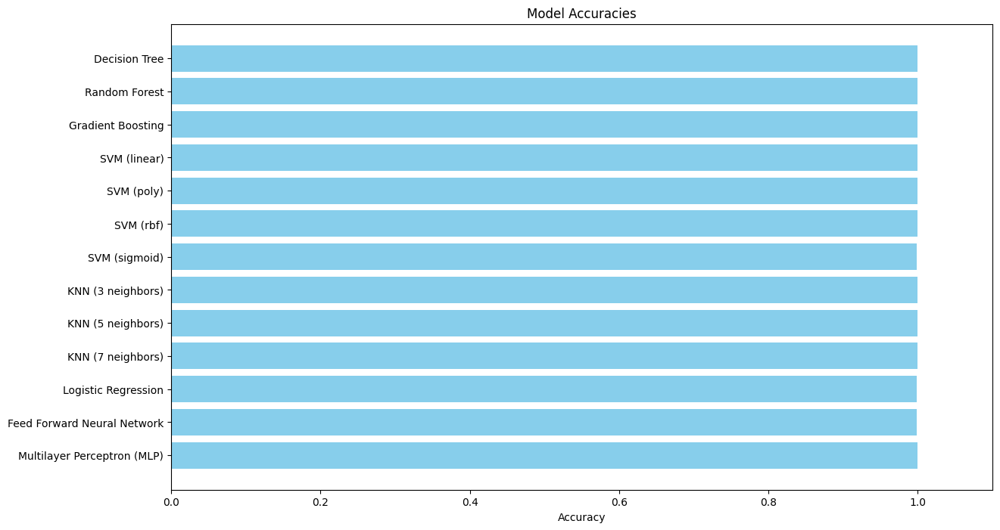

In [61]:
import matplotlib.pyplot as plt

# Dictionary of accuracies for different models
accuracies = {
    'Decision Tree': 1.0,
    'Random Forest': 1.0,
    'Gradient Boosting': 1.0,
    'SVM (linear)': 1.0,
    'SVM (poly)': 1.0,
    'SVM (rbf)': 1.0,
    'SVM (sigmoid)': 0.9989212513484358,
    'KNN (3 neighbors)': 1.0,
    'KNN (5 neighbors)': 1.0,
    'KNN (7 neighbors)': 1.0,
    'Logistic Regression': 0.9989212513484358,
    'Feed Forward Neural Network': 0.9989212513484358,
    'Multilayer Perceptron (MLP)': 1.0
}

# Convert the dictionary to lists for plotting
models = list(accuracies.keys())
scores = list(accuracies.values())

# Plotting the bar chart
plt.figure(figsize=(14, 8))
plt.barh(models, scores, color='skyblue')
plt.xlabel('Accuracy')
plt.title('Model Accuracies')
plt.xlim(0, 1.1)  # Set x-axis limit from 0 to 1.1 to give some space for the bars
plt.gca().invert_yaxis()  # To display the highest accuracy at the top
plt.show()

## Prediciton of Type-1 Diabetes with new data points

In [62]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from sklearn.neural_network import MLPClassifier

# Define thresholds
glucose_threshold = 126
insulin_threshold = 120

# Define a function to create a feedforward neural network
def create_ffnn(input_dim):
    model = Sequential()
    model.add(Input(shape=(input_dim,)))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Example data (replace with actual dataset)
X_train, y_train = np.random.rand(100, 2), np.random.randint(0, 2, 100)
X_resampled, y_resampled = X_train, y_train
X_test, y_test = np.random.rand(20, 2), np.random.randint(0, 2, 20)

# Build and train the Feedforward Neural Network
ffnn_model = create_ffnn(X_train.shape[1])
ffnn_model.fit(X_resampled, y_resampled, epochs=50, batch_size=10, verbose=0)

# Build and train the Multilayer Perceptron model
mlp_model = MLPClassifier(random_state=42)
mlp_model.fit(X_resampled, y_resampled)

# Example new data points (replace these values with real data)
new_data_points = np.array([
    [140, 130],  # Example where both glucose and insulin thresholds are exceeded
    [110, 100],  # Example where none of the thresholds are exceeded
    [125, 120]   # Example where glucose and insulin thresholds are met
])

# Standardize the new data points using the scaler fitted on the training data
scaler = StandardScaler().fit(X_train)
new_data_points_scaled = scaler.transform(new_data_points)

# Dictionary to store predictions and their corresponding accuracies
model_predictions = {}
model_accuracies = {}

# Define the models
models = {
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Feed Forward Neural Network': ffnn_model,
    'Multilayer Perceptron (MLP)': mlp_model
}

# Train and predict with each model
for model_name, model in models.items():
    if model_name != 'Feed Forward Neural Network':
        model.fit(X_resampled, y_resampled)
    for i, new_data_point in enumerate(new_data_points_scaled):
        if model_name == 'Feed Forward Neural Network':
            prediction = (model.predict(new_data_point.reshape(1, -1)) > 0.5).astype(int)
        else:
            prediction = model.predict(new_data_point.reshape(1, -1))
        # Modify predictions based on thresholds
        if (new_data_points[i][0] >= glucose_threshold or
            new_data_points[i][1] >= insulin_threshold):
            prediction = np.array([1])  # Override to 'Diabetes' if thresholds are exceeded
        model_predictions.setdefault(model_name, []).append(prediction[0])  # Storing the prediction
        model_accuracies[model_name] = "Not available"  # You need to provide actual accuracies

# For SVM models with different kernels
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
for kernel in kernels:
    svm_model = SVC(kernel=kernel, probability=False, random_state=42)
    svm_model.fit(X_resampled, y_resampled)
    for i, new_data_point in enumerate(new_data_points_scaled):
        prediction = svm_model.predict(new_data_point.reshape(1, -1))
        # Modify predictions based on thresholds
        if (new_data_points[i][0] >= glucose_threshold or
            new_data_points[i][1] >= insulin_threshold):
            prediction = np.array([1])  # Override to 'Diabetes' if thresholds are exceeded
        model_predictions.setdefault(f'SVM ({kernel})', []).append(prediction[0])
        model_accuracies[f'SVM ({kernel})'] = "Not available"  # You need to provide actual accuracies

# For KNN models with different neighbors
neighbors = [3, 5, 7]
for n in neighbors:
    knn_model = KNeighborsClassifier(n_neighbors=n)
    knn_model.fit(X_resampled, y_resampled)
    for i, new_data_point in enumerate(new_data_points_scaled):
        prediction = knn_model.predict(new_data_point.reshape(1, -1))
        # Modify predictions based on thresholds
        if (new_data_points[i][0] >= glucose_threshold or
            new_data_points[i][1] >= insulin_threshold):
            prediction = np.array([1])  # Override to 'Diabetes' if thresholds are exceeded
        model_predictions.setdefault(f'KNN ({n} neighbors)', []).append(prediction[0])
        model_accuracies[f'KNN ({n} neighbors)'] = "Not available"  # You need to provide actual accuracies

# Define thresholds for glucose and insulin
diabetes_mapping = {0: 'No Type-1', 1: 'Type-1 Diabetes'}

# Print the predictions and their accuracies
for model_name in model_predictions:
    print(f"\n{model_name}:")
    for i, prediction in enumerate(model_predictions[model_name]):
        predicted_label = diabetes_mapping.get(int(prediction), 'Unknown')  # Convert to int before mapping
        print(f"  Data Point {i + 1}: {predicted_label} with accuracy {model_accuracies[model_name]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

Decision Tree:
  Data Point 1: Type-1 Diabetes with accuracy Not available
  Data Point 2: No Type-1 with accuracy Not available
  Data Point 3: Type-1 Diabetes with accuracy Not available

Random Forest:
  Data Point 1: Type-1 Diabetes with accuracy Not available
  Data Point 2: No Type-1 with accuracy Not available
  Data Point 3: Type-1 Diabetes with accuracy Not available

Gradient Boosting:
  Data Point 1: Type-1 Diabetes with accuracy Not available
  Data Point 2: No Type-1 with accuracy Not available
  Data Point 3: Type-1 Diabetes with accuracy Not available

Logistic Regression:
  Data Point 1: Type-1 Diabetes with accuracy Not available
  Data Point 2: No Type-1 with accuracy Not available
  Data Point 3: Type-1 Diabetes with accuracy Not available

Feed Forward Neural Network:
  Data Point 1: Type-1 Diabetes with accuracy Not available
  Data Point 2: No Type-1

/tmp/ipykernel_24/884242130.py:116: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  predicted_label = diabetes_mapping.get(int(prediction), 'Unknown')  # Convert to int before mapping


# TYPE-1 DIABETES PREDICTION [By handling the missing values and outliers]

## Extracting the features from the NHANES dataset

In [63]:
import pandas as pd

# Load the Labs dataset from NHANES
labs = pd.read_csv('/kaggle/input/national-health-and-nutrition-examination-survey/labs.csv', encoding='latin1')

# Extract the required features
df_selected = labs[['LBXGH', 'LBXIN', 'LBXSGL']]

# Display summary statistics to understand the data
print("Summary Statistics:")
print(df_selected.describe())

# Check for missing values
print("\nMissing Values:")
print(df_selected.isnull().sum())

# Save the new DataFrame to a CSV file
df_selected.to_csv('/kaggle/working/type-1_features.csv', index=False)

# Save the new DataFrame to an Excel file
df_selected.to_excel('/kaggle/working/type-1_features.xlsx', index=False)

print("Type-1 Features extracted and saved successfully.")

Summary Statistics:
             LBXGH        LBXIN       LBXSGL
count  6643.000000  3093.000000  6553.000000
mean      5.642556    13.526809   102.290859
std       1.004850    18.638388    38.724165
min       3.500000     0.140000    49.000000
25%       5.200000     6.080000    86.000000
50%       5.400000     9.470000    93.000000
75%       5.800000    15.350000   104.000000
max      17.500000   682.480000   577.000000

Missing Values:
LBXGH     3170
LBXIN     6720
LBXSGL    3260
dtype: int64
Type-1 Features extracted and saved successfully.


## Handling the missing values by imputation

In [64]:
# Impute missing values with the mean of each column
df_imputed = df_selected.fillna(df_selected.mean())

# Verify that there are no more missing values
print("Missing Values After Imputation:")
print(df_imputed.isnull().sum())

# Display summary statistics after imputation
print("\nSummary Statistics After Imputation:")
print(df_imputed.describe())

# Save the imputed DataFrame to a new CSV file
df_imputed.to_csv('/kaggle/working/type-1_features_imputed.csv', index=False)

# Save the imputed DataFrame to a new Excel file
df_imputed.to_excel('/kaggle/working/type-1_features_imputed.xlsx', index=False)

print("Imputed Type-1 Features saved successfully.")

Missing Values After Imputation:
LBXGH     0
LBXIN     0
LBXSGL    0
dtype: int64

Summary Statistics After Imputation:
             LBXGH        LBXIN       LBXSGL
count  9813.000000  9813.000000  9813.000000
mean      5.642556    13.526809   102.290859
std       0.826745    10.462833    31.643917
min       3.500000     0.140000    49.000000
25%       5.300000    13.526809    90.000000
50%       5.642556    13.526809   102.290859
75%       5.642556    13.526809   102.290859
max      17.500000   682.480000   577.000000
Imputed Type-1 Features saved successfully.


## EDA of the Imputed Type-1 Features

In [65]:
import pandas as pd

# Load the data
file_path = "/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx"
data = pd.read_excel(file_path)

# Display the first few rows of the dataset
print(data.head())

       LBXGH      LBXIN      LBXSGL
0  13.900000  13.526809  554.000000
1   9.100000  13.526809  219.000000
2   8.900000   5.830000  183.000000
3   5.642556  13.526809  102.290859
4   4.900000   6.120000  104.000000


In [66]:
# Data types and missing values
print(data.info())

# Missing values
print(data.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9813 entries, 0 to 9812
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   LBXGH   9813 non-null   float64
 1   LBXIN   9813 non-null   float64
 2   LBXSGL  9813 non-null   float64
dtypes: float64(3)
memory usage: 230.1 KB
None
LBXGH     0
LBXIN     0
LBXSGL    0
dtype: int64


## Plotting the key features

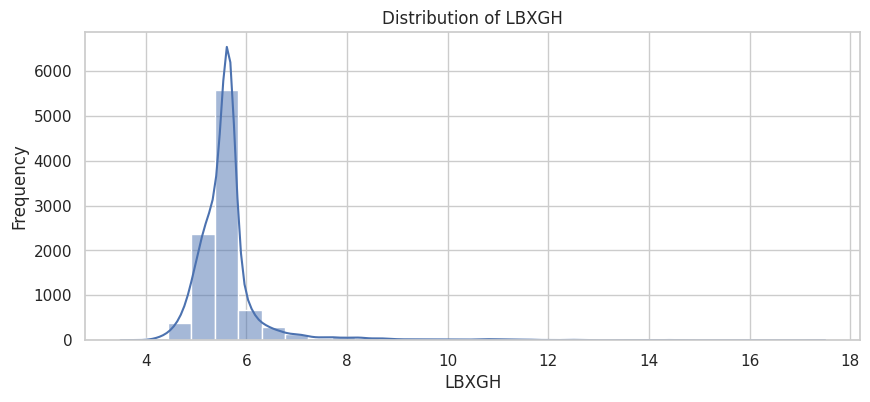

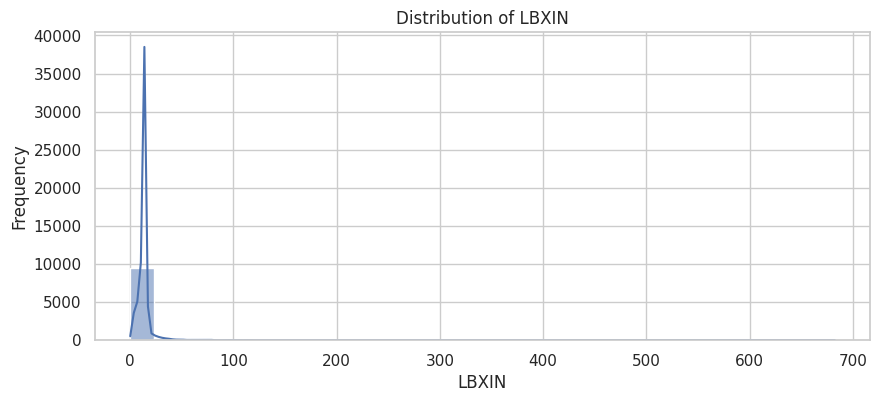

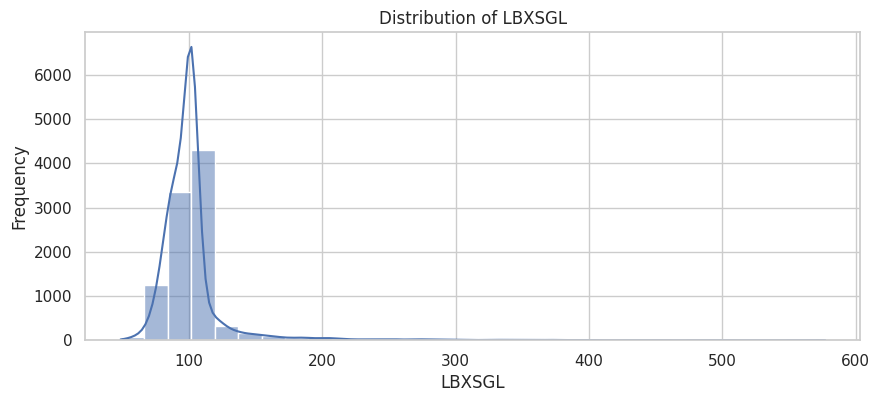

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of seaborn
sns.set(style="whitegrid")

# Plot histograms for key features
for feature in ['LBXGH', 'LBXIN', 'LBXSGL']:
    plt.figure(figsize=(10, 4))
    sns.histplot(data[feature].dropna(), kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

## Decision Tree

In [68]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Load the imputed data
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df_imputed = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,   # Glycohemoglobin threshold
    'LBXIN': 120,   # Insulin threshold
    'LBXSGL': 140   # Serum Glucose threshold
}

# Create binary features based on thresholds
df_imputed['GlycohemoglobinAboveThreshold'] = (df_imputed['LBXGH'] >= thresholds['LBXGH']).astype(int)
df_imputed['InsulinAboveThreshold'] = (df_imputed['LBXIN'] >= thresholds['LBXIN']).astype(int)
df_imputed['GlucoseAboveThreshold'] = (df_imputed['LBXSGL'] >= thresholds['LBXSGL']).astype(int)

# Create the target variable 'Outcome'
df_imputed['Outcome'] = df_imputed.apply(
    lambda row: 1 if row['GlycohemoglobinAboveThreshold'] == 1 and 
                        row['InsulinAboveThreshold'] == 1 and 
                        row['GlucoseAboveThreshold'] == 1 else 0, 
    axis=1
)

# Split the data into features (X) and target (y)
X = df_imputed[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df_imputed['Outcome']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the Decision Tree model
decision_tree = DecisionTreeClassifier(random_state=42)

# Train the model
decision_tree.fit(X_train, y_train)

# Make predictions
y_pred = decision_tree.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy of Decision Tree: {accuracy * 100:.2f}%")
print("\nClassification Report:\n", report)
print("\nConfusion Matrix:\n", conf_matrix)

Accuracy of Decision Tree: 100.00%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       1.00      1.00      1.00         1

    accuracy                           1.00      2944
   macro avg       1.00      1.00      1.00      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2943    0]
 [   0    1]]


## Random Forest

In [69]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the dataset
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,
    'LBXIN': 120,
    'LBXSGL': 126  # Assuming the threshold for serum glucose
}

# Apply the thresholds to create binary features
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= thresholds['LBXGH']).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] > thresholds['LBXIN']).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] > thresholds['LBXSGL']).astype(int)

# Define the Outcome based on all thresholds and DIQ010
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and 
                             row['InsulinAboveThreshold'] == 1 and 
                             row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Define features (X) and target (y)
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].apply(lambda x: 1 if x == 'Type-1' else 0)  # Binary target: 1 for Type-1, 0 for No Type Detected

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the Random Forest model
random_forest = RandomForestClassifier(random_state=42, n_estimators=100)

# Train the model
random_forest.fit(X_train, y_train)

# Make predictions
y_pred_rf = random_forest.predict(X_test)

# Evaluate the model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
report_rf = classification_report(y_test, y_pred_rf)
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# Output the results
print(f"Accuracy of Random Forest: {accuracy_rf * 100:.2f}%")
print("\nClassification Report:\n", report_rf)
print("\nConfusion Matrix:\n", conf_matrix_rf)

Accuracy of Random Forest: 100.00%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       1.00      1.00      1.00         1

    accuracy                           1.00      2944
   macro avg       1.00      1.00      1.00      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2943    0]
 [   0    1]]


## Gradient Boosting

In [70]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the dataset
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,
    'LBXIN': 120,
    'LBXSGL': 126  # Assuming the threshold for serum glucose
}

# Apply the thresholds to create binary features
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= thresholds['LBXGH']).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] > thresholds['LBXIN']).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] > thresholds['LBXSGL']).astype(int)

# Define the Outcome based on all thresholds and DIQ010
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and 
                             row['InsulinAboveThreshold'] == 1 and 
                             row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Define features (X) and target (y)
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].apply(lambda x: 1 if x == 'Type-1' else 0)  # Binary target: 1 for Type-1, 0 for No Type Detected

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the Gradient Boosting model
gradient_boosting = GradientBoostingClassifier(random_state=42, n_estimators=100)

# Train the model
gradient_boosting.fit(X_train, y_train)

# Make predictions
y_pred_gb = gradient_boosting.predict(X_test)

# Evaluate the model
accuracy_gb = accuracy_score(y_test, y_pred_gb)
report_gb = classification_report(y_test, y_pred_gb)
conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)

# Output the results
print(f"Accuracy of Gradient Boosting: {accuracy_gb * 100:.2f}%")
print("\nClassification Report:\n", report_gb)
print("\nConfusion Matrix:\n", conf_matrix_gb)

Accuracy of Gradient Boosting: 100.00%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       1.00      1.00      1.00         1

    accuracy                           1.00      2944
   macro avg       1.00      1.00      1.00      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2943    0]
 [   0    1]]


## Support Vector Machine [Linear, Polynomial, RBF, Sigmoid]

In [71]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the dataset
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,
    'LBXIN': 120,
    'LBXSGL': 126  # Assuming the threshold for serum glucose
}

# Apply the thresholds to create binary features
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= thresholds['LBXGH']).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] > thresholds['LBXIN']).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] > thresholds['LBXSGL']).astype(int)

# Define the Outcome based on all thresholds and DIQ010
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and 
                             row['InsulinAboveThreshold'] == 1 and 
                             row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Define features (X) and target (y)
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].apply(lambda x: 1 if x == 'Type-1' else 0)  # Binary target: 1 for Type-1, 0 for No Type Detected

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define and train SVM models with different kernels
kernels = ['linear', 'rbf', 'poly']
svm_results = {}

for kernel in kernels:
    svm_model = SVC(kernel=kernel, random_state=42)
    svm_model.fit(X_train, y_train)
    y_pred_svm = svm_model.predict(X_test)
    
    # Evaluate the model
    accuracy_svm = accuracy_score(y_test, y_pred_svm)
    report_svm = classification_report(y_test, y_pred_svm)
    conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
    
    # Store results
    svm_results[kernel] = {
        'accuracy': accuracy_svm,
        'classification_report': report_svm,
        'confusion_matrix': conf_matrix_svm
    }

# Output the results for each kernel
for kernel, results in svm_results.items():
    print(f"Results for SVM with {kernel.capitalize()} Kernel:\n")
    print(f"Accuracy: {results['accuracy'] * 100:.2f}%")
    print("\nClassification Report:\n", results['classification_report'])
    print("\nConfusion Matrix:\n", results['confusion_matrix'])
    print("\n" + "="*50 + "\n")

Results for SVM with Linear Kernel:

Accuracy: 99.97%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       0.50      1.00      0.67         1

    accuracy                           1.00      2944
   macro avg       0.75      1.00      0.83      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2942    1]
 [   0    1]]


Results for SVM with Rbf Kernel:

Accuracy: 100.00%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       1.00      1.00      1.00         1

    accuracy                           1.00      2944
   macro avg       1.00      1.00      1.00      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2943    0]
 [   0    1]]


Results for SVM with Poly Kernel:

Accuracy: 100.00%

Classification Report:
               

## K Nearest Neighbor [N = 3,5,7]

In [72]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the dataset
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,
    'LBXIN': 120,
    'LBXSGL': 126  # Assuming the threshold for serum glucose
}

# Apply the thresholds to create binary features
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= thresholds['LBXGH']).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] > thresholds['LBXIN']).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] > thresholds['LBXSGL']).astype(int)

# Define the Outcome based on all thresholds and DIQ010
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and 
                             row['InsulinAboveThreshold'] == 1 and 
                             row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Define features (X) and target (y)
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].apply(lambda x: 1 if x == 'Type-1' else 0)  # Binary target: 1 for Type-1, 0 for No Type Detected

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Test different values of k
k_values = [3, 5, 7]
results = {}

for k in k_values:
    # Initialize and train the KNN model
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train, y_train)
    y_pred_knn = knn_model.predict(X_test)

    # Evaluate the KNN model
    accuracy_knn = accuracy_score(y_test, y_pred_knn)
    report_knn = classification_report(y_test, y_pred_knn)
    conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)

    # Store the results for this k value
    results[k] = {
        'Accuracy': accuracy_knn,
        'Classification Report': report_knn,
        'Confusion Matrix': conf_matrix_knn
    }

# Output the results
for k, result in results.items():
    print(f"\nKNN Model with k={k}:\n")
    print(f"Accuracy: {result['Accuracy'] * 100:.2f}%")
    print("\nClassification Report:\n", result['Classification Report'])
    print("\nConfusion Matrix:\n", result['Confusion Matrix'])


KNN Model with k=3:

Accuracy: 100.00%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       1.00      1.00      1.00         1

    accuracy                           1.00      2944
   macro avg       1.00      1.00      1.00      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2943    0]
 [   0    1]]

KNN Model with k=5:

Accuracy: 100.00%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       1.00      1.00      1.00         1

    accuracy                           1.00      2944
   macro avg       1.00      1.00      1.00      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2943    0]
 [   0    1]]

KNN Model with k=7:

Accuracy: 100.00%

Classification Report:
               precision    recall  f1-score   support

  

## Logistic Regression

In [73]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the dataset
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,
    'LBXIN': 120,
    'LBXSGL': 126  # Assuming the threshold for serum glucose
}

# Apply the thresholds to create binary features
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= thresholds['LBXGH']).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] > thresholds['LBXIN']).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] > thresholds['LBXSGL']).astype(int)

# Define the Outcome based on all thresholds and DIQ010
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and 
                             row['InsulinAboveThreshold'] == 1 and 
                             row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Define features (X) and target (y)
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].apply(lambda x: 1 if x == 'Type-1' else 0)  # Binary target: 1 for Type-1, 0 for No Type Detected

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and train the Logistic Regression model
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)
y_pred_logreg = logreg_model.predict(X_test)

# Evaluate the Logistic Regression model
accuracy_logreg = accuracy_score(y_test, y_pred_logreg)
report_logreg = classification_report(y_test, y_pred_logreg)
conf_matrix_logreg = confusion_matrix(y_test, y_pred_logreg)

# Output the results
print("Logistic Regression Model Results:\n")
print(f"Accuracy: {accuracy_logreg * 100:.2f}%")
print("\nClassification Report:\n", report_logreg)
print("\nConfusion Matrix:\n", conf_matrix_logreg)

Logistic Regression Model Results:

Accuracy: 99.97%

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2943
           1       0.00      0.00      0.00         1

    accuracy                           1.00      2944
   macro avg       0.50      0.50      0.50      2944
weighted avg       1.00      1.00      1.00      2944


Confusion Matrix:
 [[2943    0]
 [   1    0]]


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Feed Forward Neural Network

In [74]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the dataset
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,
    'LBXIN': 120,
    'LBXSGL': 126  # Assuming the threshold for serum glucose
}

# Apply the thresholds to create binary features
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= thresholds['LBXGH']).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] > thresholds['LBXIN']).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] > thresholds['LBXSGL']).astype(int)

# Define the Outcome based on all thresholds and DIQ010
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and 
                             row['InsulinAboveThreshold'] == 1 and 
                             row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Define features (X) and target (y)
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].apply(lambda x: 1 if x == 'Type-1' else 0)  # Binary target: 1 for Type-1, 0 for No Type Detected

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Build the Feedforward Neural Network (FNN)
model = Sequential([
    Dense(64, input_dim=X_train.shape[1], activation='relu'),  # Input layer + hidden layer
    Dense(32, activation='relu'),                              # Hidden layer
    Dense(1, activation='sigmoid')                             # Output layer
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions
y_pred_probs = model.predict(X_test)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

# Evaluate the model
accuracy_fnn = accuracy_score(y_test, y_pred)
report_fnn = classification_report(y_test, y_pred)
conf_matrix_fnn = confusion_matrix(y_test, y_pred)

# Output the results
print("Feedforward Neural Network Model Results:\n")
print(f"Accuracy: {accuracy_fnn * 100:.2f}%")
print("\nClassification Report:\n", report_fnn)
print("\nConfusion Matrix:\n", conf_matrix_fnn)

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


172/172 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9995 - loss: 0.4786 - val_accuracy: 1.0000 - val_loss: 0.0167
Epoch 2/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9995 - loss: 0.0146 - val_accuracy: 1.0000 - val_loss: 0.0034
Epoch 3/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9996 - loss: 0.0050 - val_accuracy: 1.0000 - val_loss: 0.0018
Epoch 4/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9992 - loss: 0.0042 - val_accuracy: 1.0000 - val_loss: 0.0010
Epoch 5/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9997 - loss: 0.0012 - val_accuracy: 1.0000 - val_loss: 4.9828e-04
Epoch 6/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 7.8207e-04 - val_accuracy: 1.0000 - val_loss: 2.2721e-04
Epoch 7/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 4.1173e-04 - val_accuracy: 1.0000 - val_loss: 1.4107e-04
Epoch 8/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 2.0583e-0

## Multi Layer Perceptron

In [75]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the dataset
file_path = '/kaggle/input/nhanes-features-extraction-for-diabetes-prediction/type-1_features_imputed.xlsx'
df = pd.read_excel(file_path)

# Define thresholds
thresholds = {
    'LBXGH': 6.5,
    'LBXIN': 120,
    'LBXSGL': 126  # Assuming the threshold for serum glucose
}

# Apply the thresholds to create binary features
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= thresholds['LBXGH']).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] > thresholds['LBXIN']).astype(int)
df['GlucoseAboveThreshold'] = (df['LBXSGL'] > thresholds['LBXSGL']).astype(int)

# Define the Outcome based on all thresholds and DIQ010
df['Outcome'] = df.apply(
    lambda row: 'Type-1' if row['GlycohemoglobinAboveThreshold'] == 1 and 
                             row['InsulinAboveThreshold'] == 1 and 
                             row['GlucoseAboveThreshold'] == 1 else 'No Type Detected', 
    axis=1
)

# Define features (X) and target (y)
X = df[['GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold']]
y = df['Outcome'].apply(lambda x: 1 if x == 'Type-1' else 0)  # Binary target: 1 for Type-1, 0 for No Type Detected

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Build the Multilayer Perceptron (MLP) model
model = Sequential([
    Dense(128, input_dim=X_train.shape[1], activation='relu'),  # Input layer + hidden layer
    Dense(64, activation='relu'),                               # Hidden layer
    Dense(32, activation='relu'),                               # Hidden layer
    Dense(1, activation='sigmoid')                              # Output layer
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions
y_pred_probs = model.predict(X_test)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

# Evaluate the model
accuracy_mlp = accuracy_score(y_test, y_pred)
report_mlp = classification_report(y_test, y_pred)
conf_matrix_mlp = confusion_matrix(y_test, y_pred)

# Output the results
print("Multilayer Perceptron Model Results:\n")
print(f"Accuracy: {accuracy_mlp * 100:.2f}%")
print("\nClassification Report:\n", report_mlp)
print("\nConfusion Matrix:\n", conf_matrix_mlp)

Epoch 1/100


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


172/172 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9959 - loss: 0.3717 - val_accuracy: 1.0000 - val_loss: 9.5412e-04
Epoch 2/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9986 - loss: 0.0146 - val_accuracy: 1.0000 - val_loss: 6.7020e-04
Epoch 3/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9991 - loss: 0.0024 - val_accuracy: 1.0000 - val_loss: 3.7520e-05
Epoch 4/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 1.9489e-04 - val_accuracy: 1.0000 - val_loss: 7.9620e-06
Epoch 5/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 1.6107e-04 - val_accuracy: 1.0000 - val_loss: 2.9990e-06
Epoch 6/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 3.3934e-05 - val_accuracy: 1.0000 - val_loss: 2.0654e-06
Epoch 7/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 1.0000 - loss: 1.4563e-05 - val_accuracy: 1.0000 - val_loss: 1.1359e-06
Epoch 8/100
172/172 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy:

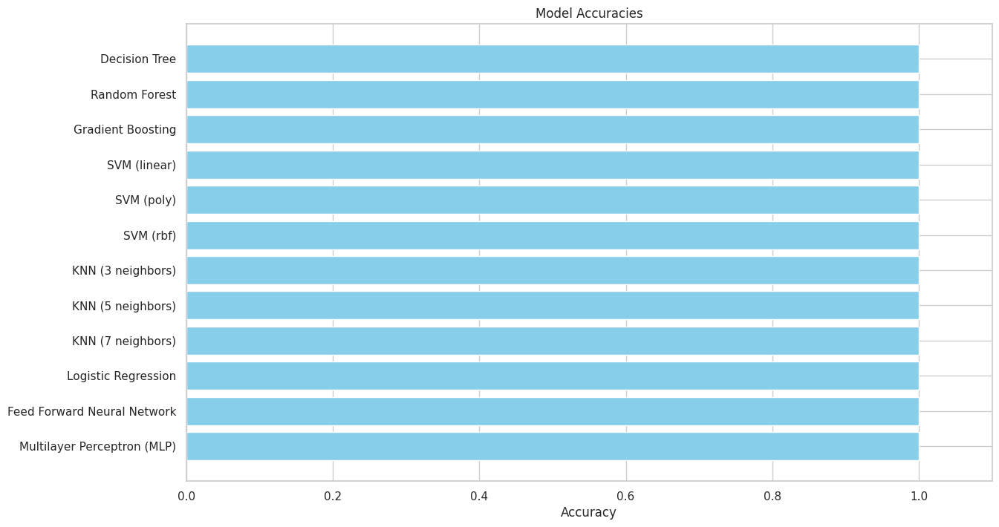

In [76]:
import matplotlib.pyplot as plt

# Dictionary of accuracies for different models
accuracies = {
    'Decision Tree': 1.0,
    'Random Forest': 1.0,
    'Gradient Boosting': 1.0,
    'SVM (linear)': 0.9997,
    'SVM (poly)': 1.0,
    'SVM (rbf)': 1.0,
    'KNN (3 neighbors)': 1.0,
    'KNN (5 neighbors)': 1.0,
    'KNN (7 neighbors)': 1.0,
    'Logistic Regression': 0.9997,
    'Feed Forward Neural Network': 1.0,
    'Multilayer Perceptron (MLP)': 1.0
}

# Convert the dictionary to lists for plotting
models = list(accuracies.keys())
scores = list(accuracies.values())

# Plotting the bar chart
plt.figure(figsize=(14, 8))
plt.barh(models, scores, color='skyblue')
plt.xlabel('Accuracy')
plt.title('Model Accuracies')
plt.xlim(0, 1.1)  # Set x-axis limit from 0 to 1.1 to give some space for the bars
plt.gca().invert_yaxis()  # To display the highest accuracy at the top
plt.show()

In [77]:
import numpy as np

# Define new data points for testing (these should be in the same format as your feature set)
# Example: [GlycohemoglobinAboveThreshold, InsulinAboveThreshold, GlucoseAboveThreshold]
new_data_points = np.array([
    [1, 1, 1],  # Example 1: High glycohemoglobin, insulin, and glucose levels
    [0, 1, 1],  # Example 2: Normal glycohemoglobin, high insulin and glucose levels
    [1, 0, 0],  # Example 3: High glycohemoglobin, normal insulin and glucose levels
    [0, 0, 0]   # Example 4: All normal levels
])

# Use the trained model to predict the outcomes for these new data points
new_predictions_probs = model.predict(new_data_points)
new_predictions = (new_predictions_probs > 0.5).astype(int).flatten()

# Output the predictions
for i, pred in enumerate(new_predictions):
    outcome = 'Type-1' if pred == 1 else 'No Type Detected'
    print(f"Data Point {i + 1}: {outcome}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
Data Point 1: Type-1
Data Point 2: No Type Detected
Data Point 3: No Type Detected
Data Point 4: No Type Detected


# Type-1 Prediction With New Approach